In [19]:
import sys
sys.path.append('../')
sys.path.append('../4_watershed')
sys.path.append('../splinedistm')

import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from csbdeep.utils import normalize
from glob import glob
from skimage import io
from splinedist.models import SplineDist2D
from stardist.matching import matching_dataset
from stardist.models import StarDist2D
from tqdm import tqdm

from watershedfunc import avg_precision, evaluate_all, f1_score, get_best_params, get_confusion_matrix_vals, watershed_seg
from utils import save_scores_csv, show_test_images, taus

In [20]:
image_dir = '/storage/annajiwons/images'
nuclei_4t1_dir = f'{image_dir}/4t1'
smfish_4t1_dir = f'{image_dir}/4t1-smfish'

In [21]:
# Load images in train and test dirs
X_test_names = glob(f'{nuclei_4t1_dir}/test/images/*.tif')
X_test_names.extend(glob(f'{nuclei_4t1_dir}/train/images/*.tif'))
X_test_names.sort(key=lambda name: name[-6:])
X_test = [normalize(img, 1, 99.8, axis=(0, 1)) for img in list(map(io.imread, X_test_names))]

In [22]:
# Load masks in train and test dirs
Y_test_names = glob(f'{nuclei_4t1_dir}/test/masks/*.tif')
Y_test_names.extend(glob(f'{nuclei_4t1_dir}/train/masks/*.tif'))
Y_test_names.sort(key=lambda name: name[-6:])
Y_test = list(map(io.imread, Y_test_names))

# Pretrained StarDist model

Found model '2D_versatile_fluo' for 'StarDist2D'.
  0%|          | 0/11 [00:00<?, ?it/s]Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
100%|██████████| 9/9 [00:22<00:00,  2.47s/it]
[DatasetMatching(criterion='iou', thresh=0.1, fp=7, tp=52, fn=307, precision=0.8813559322033898, recall=0.14484679665738162, accuracy=0.14207650273224043, f1=0.24880382775119617, n_true=359, n_pred=59, mean_true_score=0.10487541937217255, mean_matched_score=0.724043760665576, panoptic_quality=0.18014485911296627, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=8, tp=51, fn=308, precision=0.864406779661017, recall=0.14206128133704735, accuracy=0.13896457765667575, f1=0.24401913875598086, n_true=359, n_pred=59, mean_true_score=0.10434587316543079, mean_matched_score=0.7345131071841109, panoptic_quality=0.17923525582004618, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=8, t

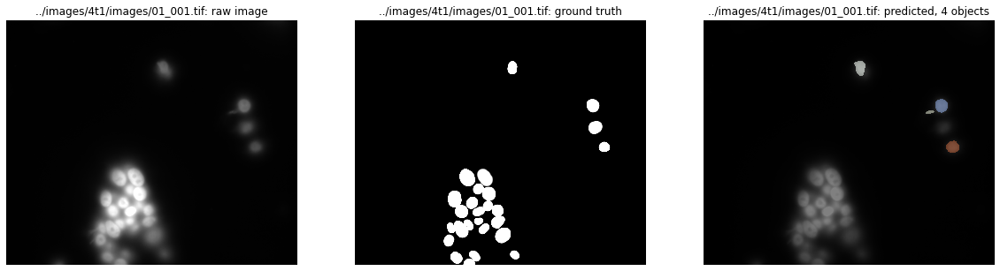

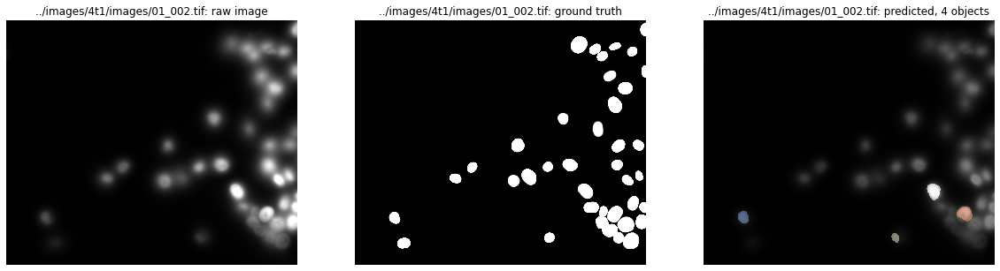

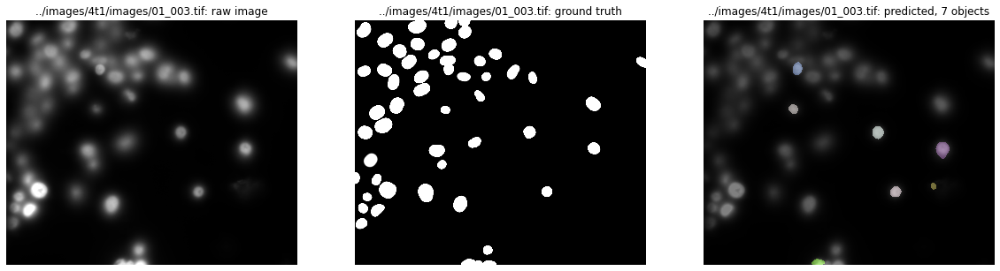

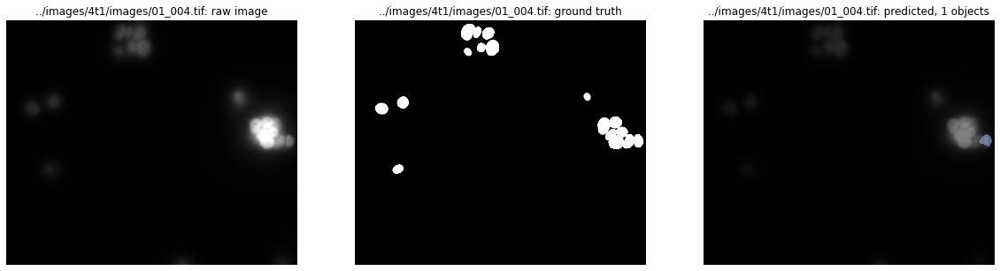

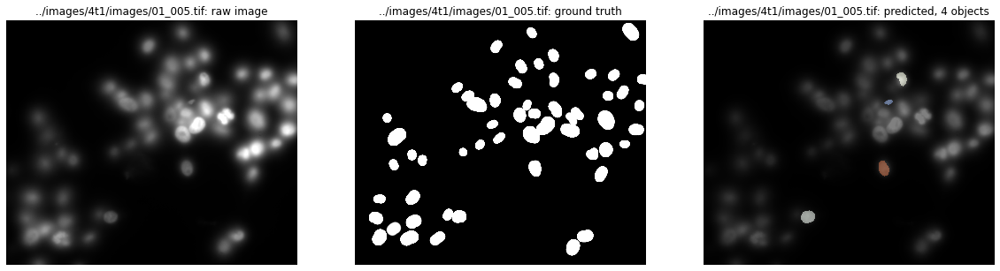

...

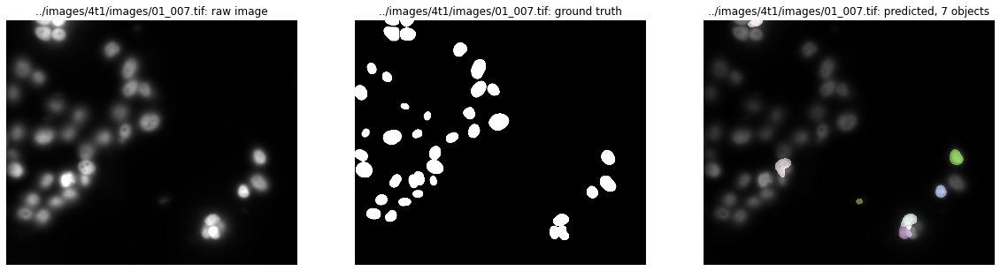

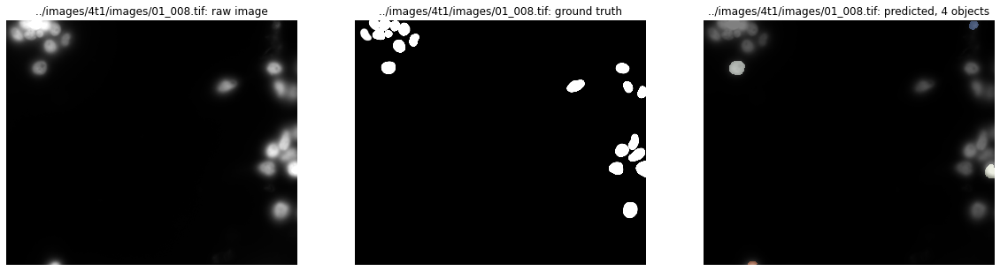

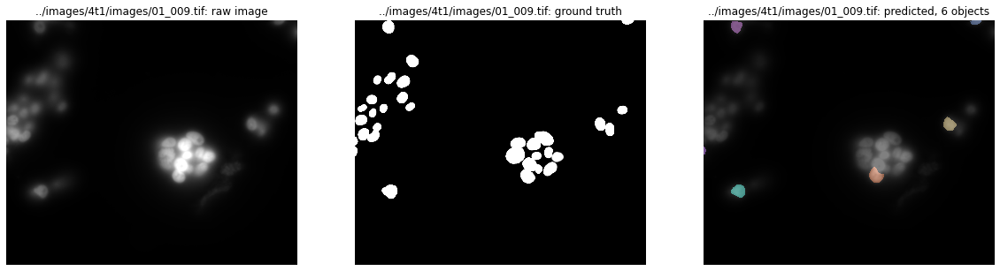

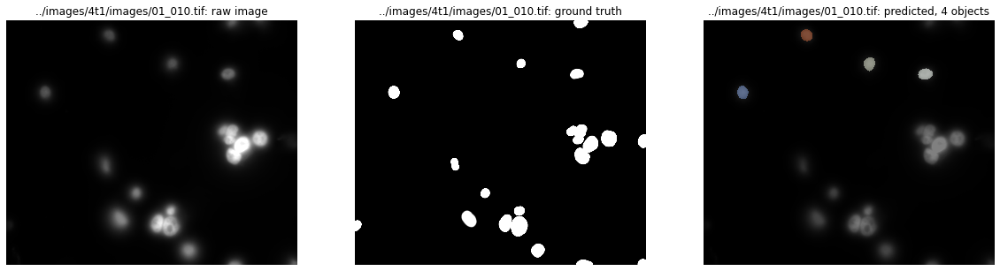

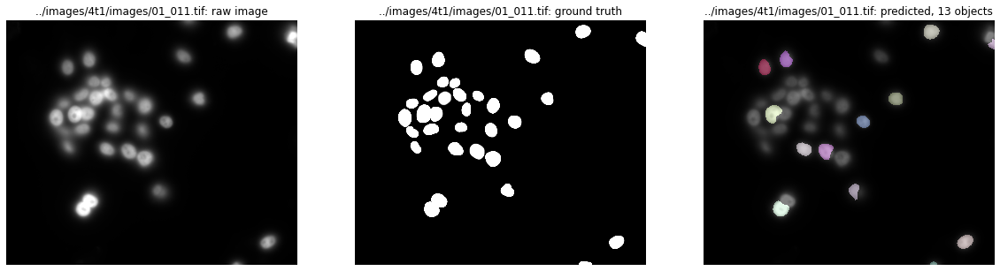

In [4]:
# Load pretrained model for 2d fluorescent images
pretrained_stardist_model = StarDist2D.from_pretrained('2D_versatile_fluo')

# Predict
Y_pred = [pretrained_stardist_model.predict_instances(x, n_tiles=pretrained_stardist_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_pretrained_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# Pretrained StarDist model + 5 Additional U2OS images

  0%|          | 0/11 [00:00<?, ?it/s]

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 9/9 [00:43<00:00,  4.86s/it]


[DatasetMatching(criterion='iou', thresh=0.1, fp=13, tp=256, fn=103, precision=0.9516728624535316, recall=0.713091922005571, accuracy=0.6881720430107527, f1=0.8152866242038217, n_true=359, n_pred=269, mean_true_score=0.3609839919030447, mean_matched_score=0.5062236448952854, panoptic_quality=0.4127173665388314, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=42, tp=227, fn=132, precision=0.8438661710037175, recall=0.6323119777158774, accuracy=0.5660847880299252, f1=0.7229299363057324, n_true=359, n_pred=269, mean_true_score=0.34780087733082327, mean_matched_score=0.5500463214174693, panoptic_quality=0.3976449521075336, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=91, tp=178, fn=181, precision=0.6617100371747212, recall=0.4958217270194986, accuracy=0.39555555555555555, f1=0.5668789808917197, n_true=359, n_pred=269, mean_true_score=0.31403578047925595, mean_matched_score=0.6333642988317577, panoptic_quality=0.35904090825494545, by_image=False), Datase

True

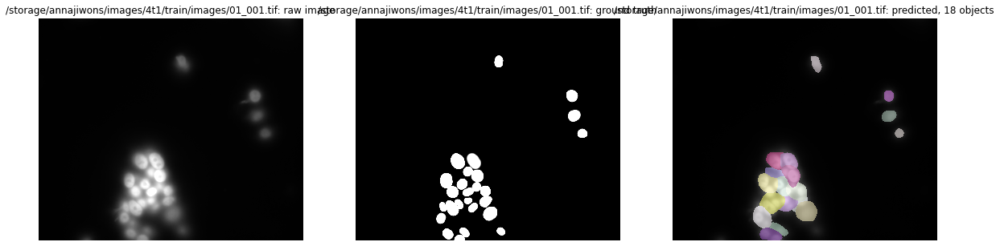

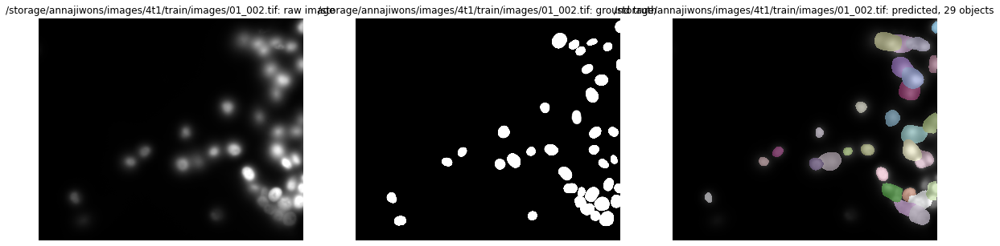

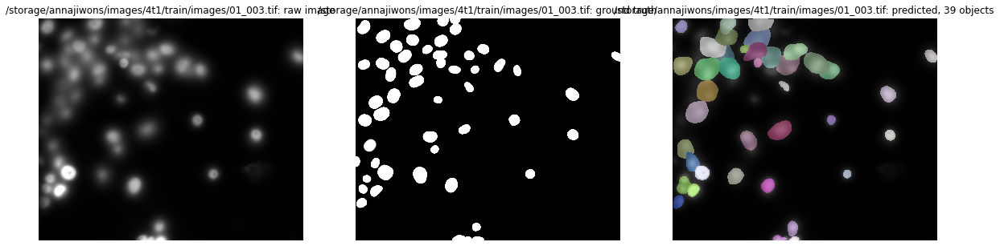

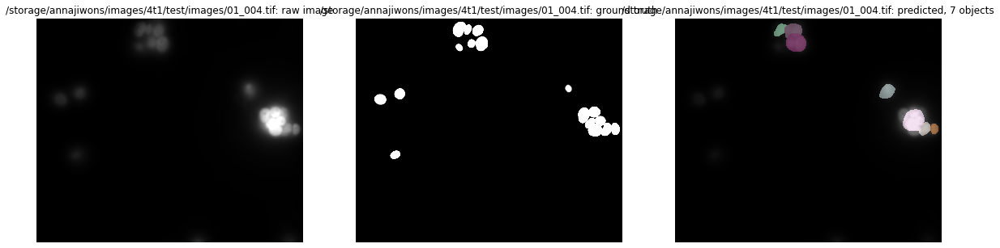

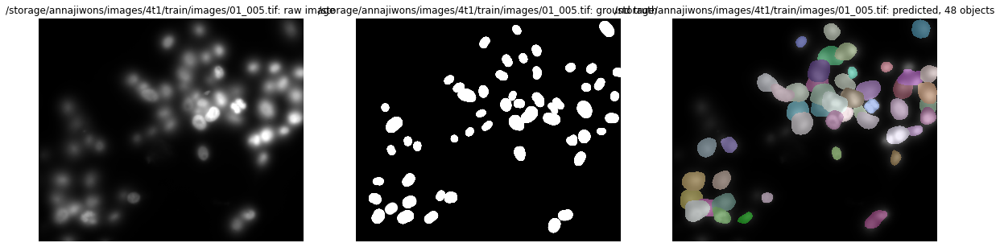

...

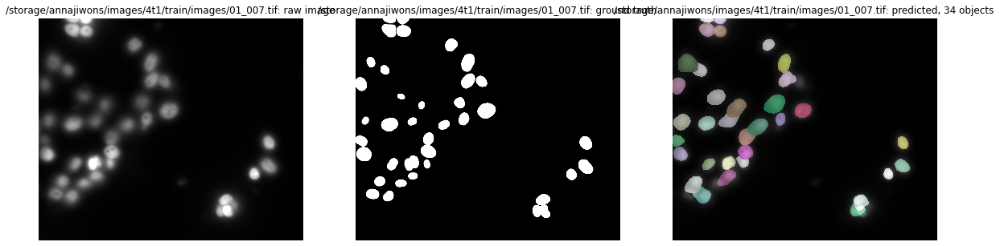

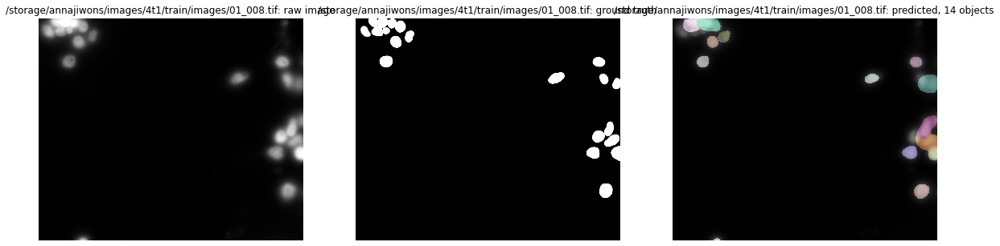

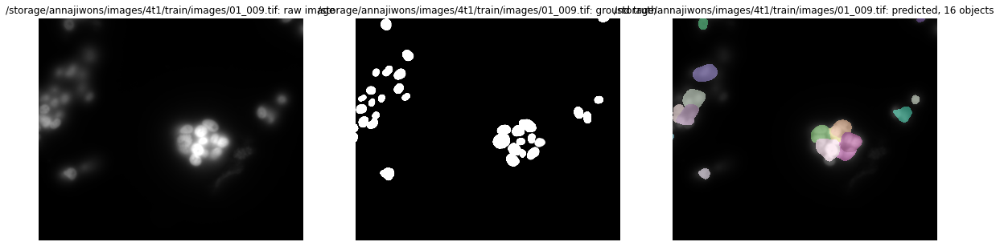

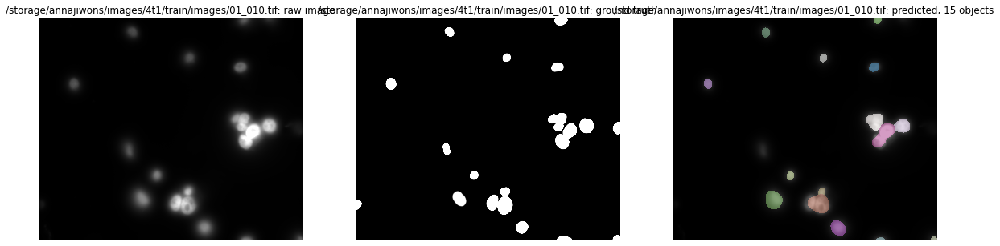

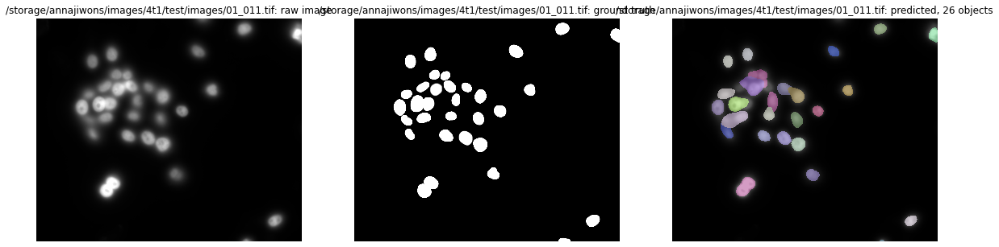

In [23]:
# Load model
pretrained_add5_stardist_model = StarDist2D(None, 
                                 name='2D_versatile_fluo_5', 
                                 basedir='../0_pretrained_stardist_merfish_add_train/models')

# Predict
Y_pred = [pretrained_add5_stardist_model.predict_instances(x, n_tiles=pretrained_add5_stardist_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_pretrained_add5_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# Save example image
cv.imwrite('4t1_model2.tif', Y_pred[10][0])

# Pretrained StarDist model + 10 Additional U2OS images

  0%|          | 0/11 [00:00<?, ?it/s]

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 9/9 [00:41<00:00,  4.66s/it]


[DatasetMatching(criterion='iou', thresh=0.1, fp=21, tp=264, fn=95, precision=0.9263157894736842, recall=0.7353760445682451, accuracy=0.6947368421052632, f1=0.8198757763975155, n_true=359, n_pred=285, mean_true_score=0.3637904761622044, mean_matched_score=0.49469992781148253, panoptic_quality=0.4055924873982341, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=57, tp=228, fn=131, precision=0.8, recall=0.6350974930362117, accuracy=0.5480769230769231, f1=0.7080745341614907, n_true=359, n_pred=285, mean_true_score=0.34697393230680096, mean_matched_score=0.5463317618339542, panoptic_quality=0.3868436077582036, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=89, tp=196, fn=163, precision=0.6877192982456141, recall=0.5459610027855153, accuracy=0.4375, f1=0.6086956521739131, n_true=359, n_pred=285, mean_true_score=0.3259792282034425, mean_matched_score=0.5970741985971217, panoptic_quality=0.3634364687112915, by_image=False), DatasetMatching(criterion='iou', th

True

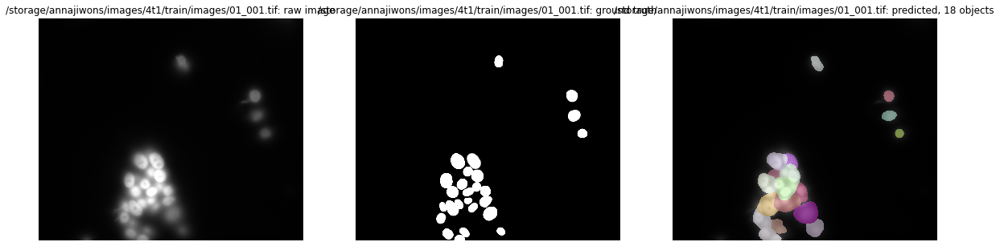

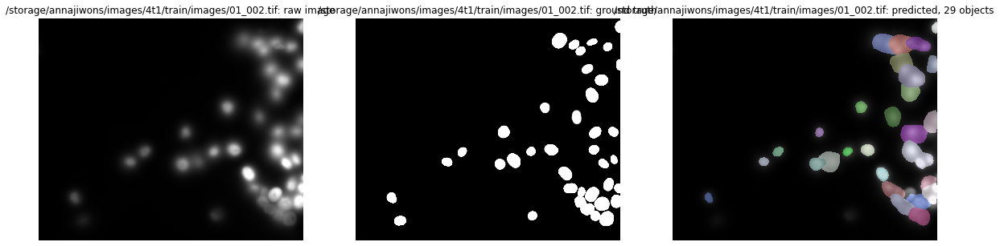

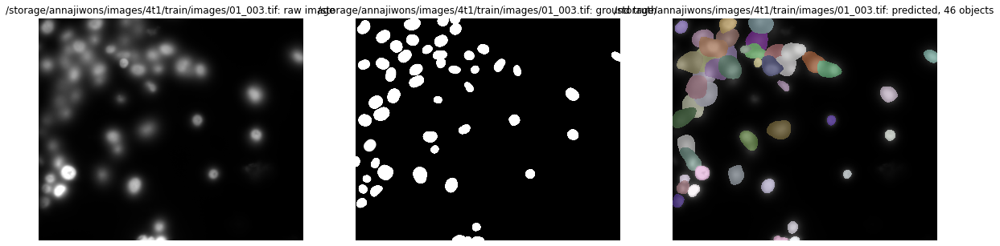

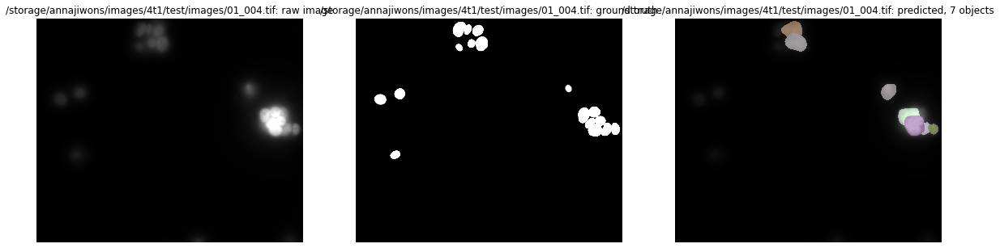

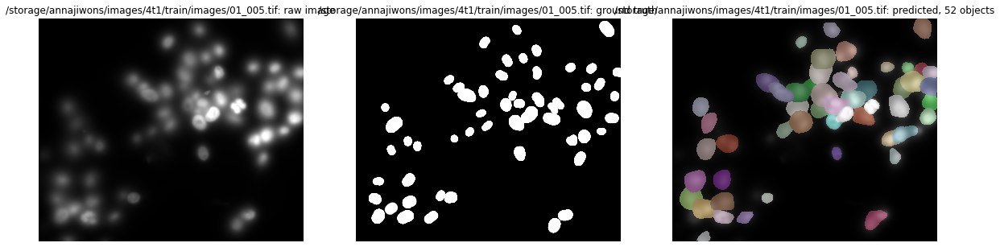

...

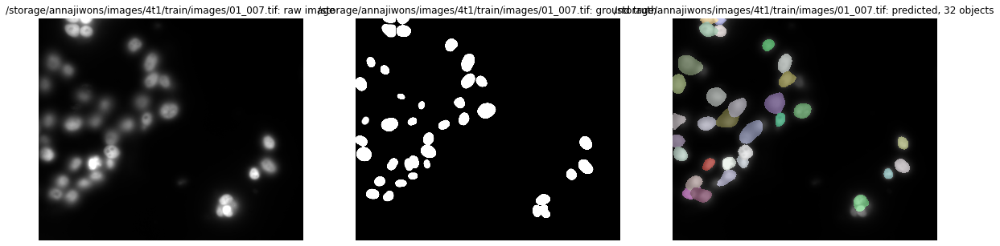

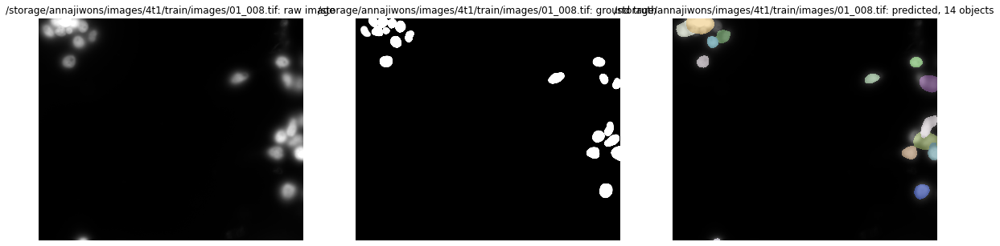

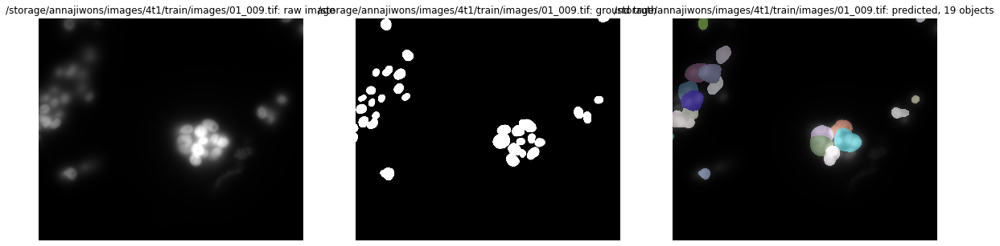

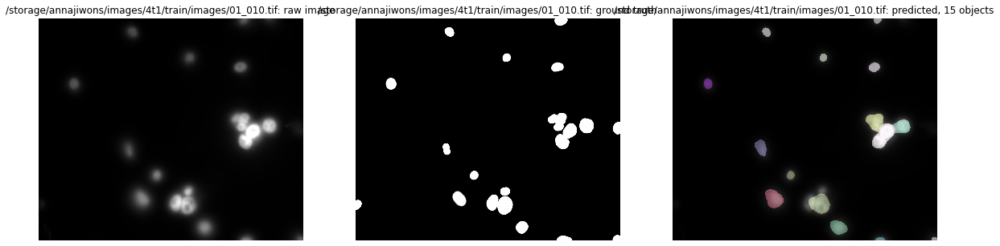

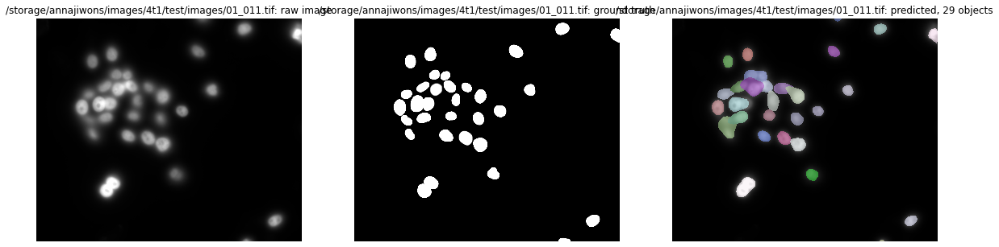

In [24]:
# Load model
pretrained_add10_stardist_model = StarDist2D(None, 
                                 name='2D_versatile_fluo_10', 
                                 basedir='../0_pretrained_stardist_merfish_add_train/models')

# Predict
Y_pred = [pretrained_add10_stardist_model.predict_instances(x, n_tiles=pretrained_add10_stardist_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_pretrained_add10_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# Save example image
cv.imwrite('4t1_model3.tif', Y_pred[10][0])

# StarDist model trained on 5 U2OS nuclei images

  0%|          | 0/11 [00:00<?, ?it/s]

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 9/9 [01:05<00:00,  7.24s/it]


[DatasetMatching(criterion='iou', thresh=0.1, fp=21, tp=259, fn=100, precision=0.925, recall=0.7214484679665738, accuracy=0.6815789473684211, f1=0.810641627543036, n_true=359, n_pred=280, mean_true_score=0.38163838959426066, mean_matched_score=0.5289891191673343, panoptic_quality=0.4288206005143649, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=35, tp=245, fn=114, precision=0.875, recall=0.6824512534818942, accuracy=0.6218274111675127, f1=0.7668231611893583, n_true=359, n_pred=280, mean_true_score=0.37514993140335373, mean_matched_score=0.5497094913216489, panoptic_quality=0.421529969871061, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=67, tp=213, fn=146, precision=0.7607142857142857, recall=0.5933147632311978, accuracy=0.5, f1=0.6666666666666666, n_true=359, n_pred=280, mean_true_score=0.3523699012414226, mean_matched_score=0.5939004438763883, panoptic_quality=0.39593362925092557, by_image=False), DatasetMatching(criterion='iou', thresh=0.4, fp=1

True

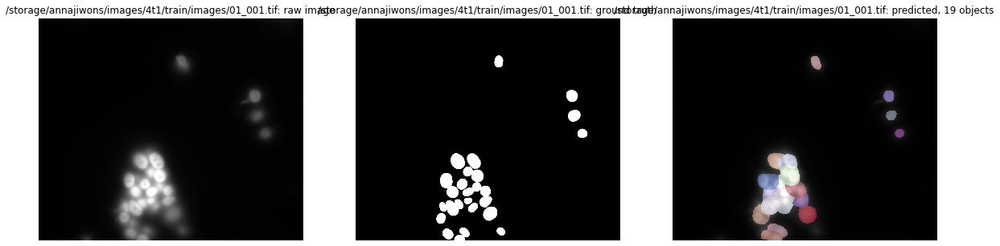

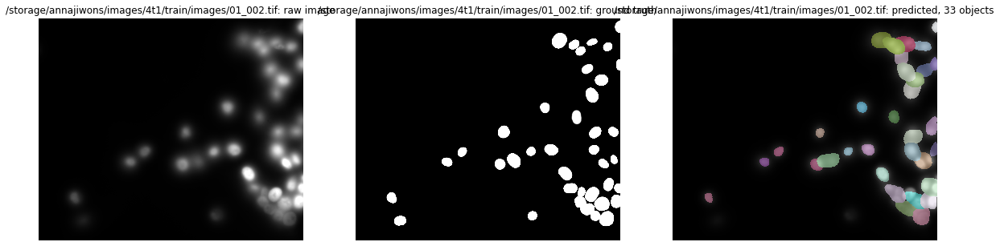

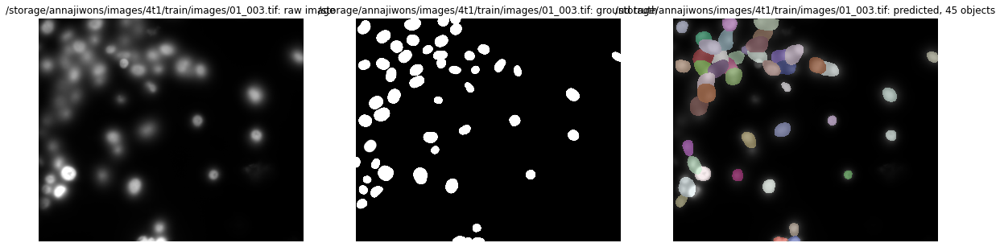

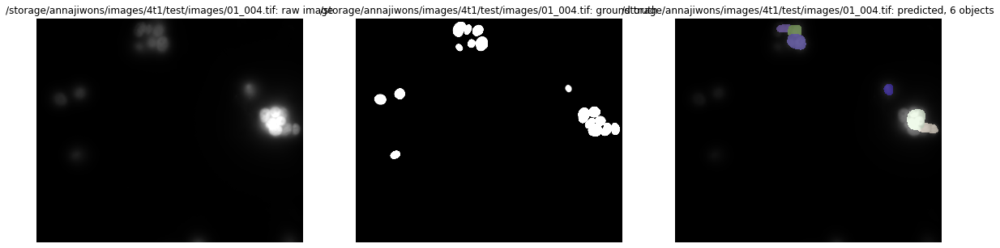

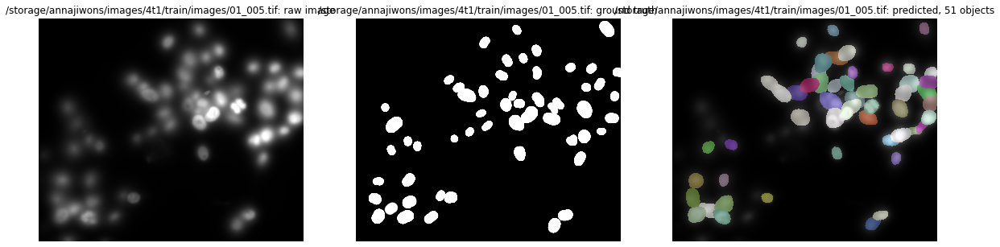

...

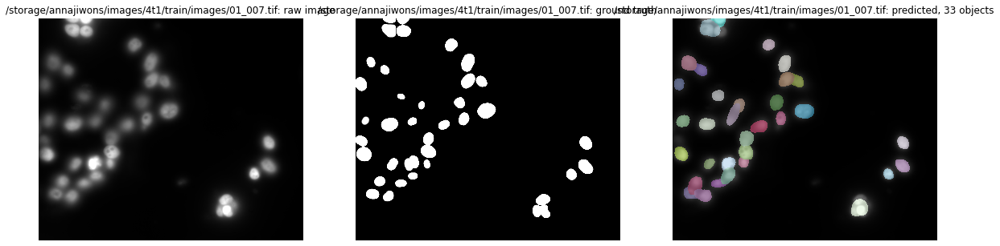

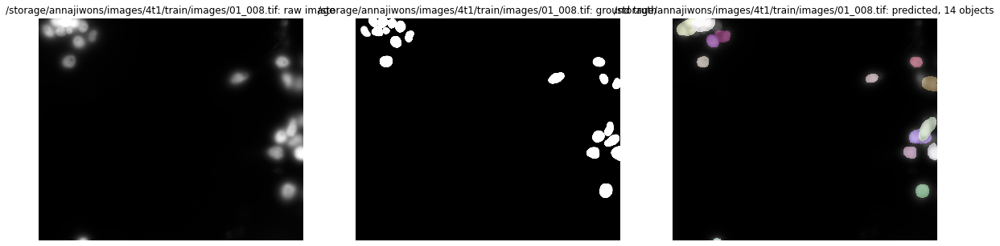

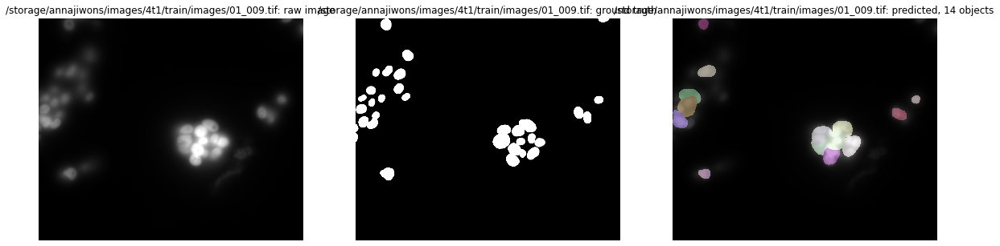

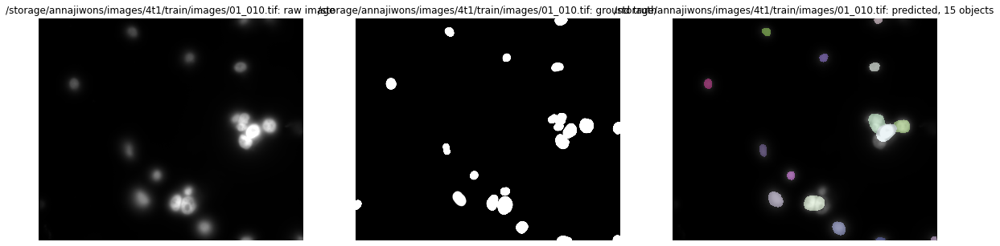

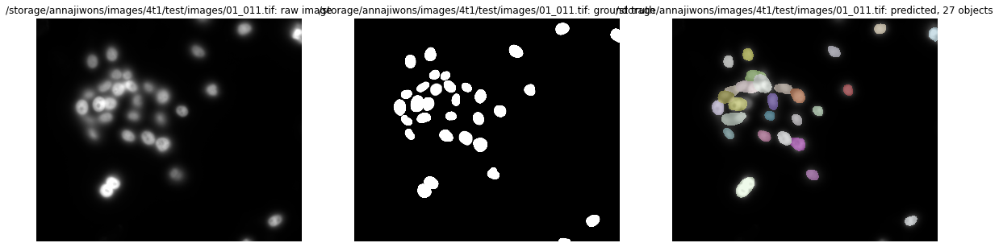

In [25]:
# Load model
stardist_5_model = StarDist2D(None, 
                                 name='2D_versatile_fluo_5', 
                                 basedir='../8_stardist_less_imgs/models')

# Predict
Y_pred = [stardist_5_model.predict_instances(x, n_tiles=stardist_5_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '4t1_model4')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# Save example image
cv.imwrite('4t1_model4.tif', Y_pred[10][0])

# StarDist model trained on 10 U2OS nuclei images

  0%|          | 0/11 [00:00<?, ?it/s]

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 9/9 [00:42<00:00,  4.75s/it]


[DatasetMatching(criterion='iou', thresh=0.1, fp=13, tp=240, fn=119, precision=0.9486166007905138, recall=0.6685236768802229, accuracy=0.6451612903225806, f1=0.7843137254901961, n_true=359, n_pred=253, mean_true_score=0.3534328064272886, mean_matched_score=0.5286765729474858, panoptic_quality=0.41464829250783203, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=25, tp=228, fn=131, precision=0.9011857707509882, recall=0.6350974930362117, accuracy=0.59375, f1=0.7450980392156863, n_true=359, n_pred=253, mean_true_score=0.3478952434311009, mean_matched_score=0.5477824227709001, panoptic_quality=0.40815160912341575, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=57, tp=196, fn=163, precision=0.7747035573122529, recall=0.5459610027855153, accuracy=0.47115384615384615, f1=0.6405228758169934, n_true=359, n_pred=253, mean_true_score=0.32567058714113684, mean_matched_score=0.5965088815493271, panoptic_quality=0.3820775842603534, by_image=False), DatasetMatching(

True

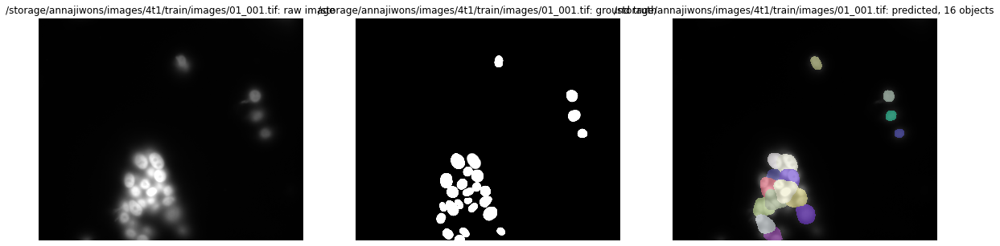

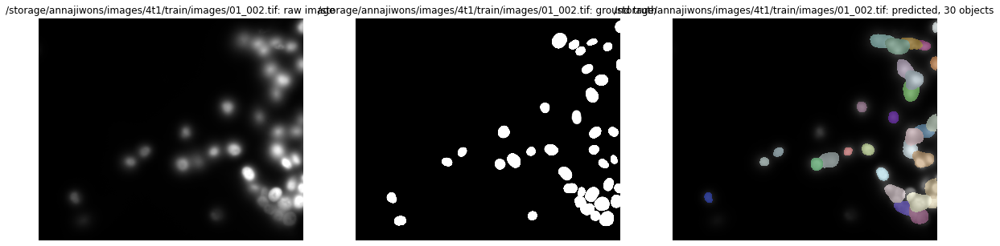

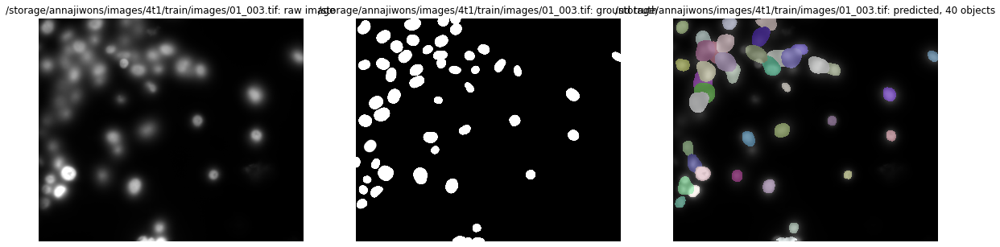

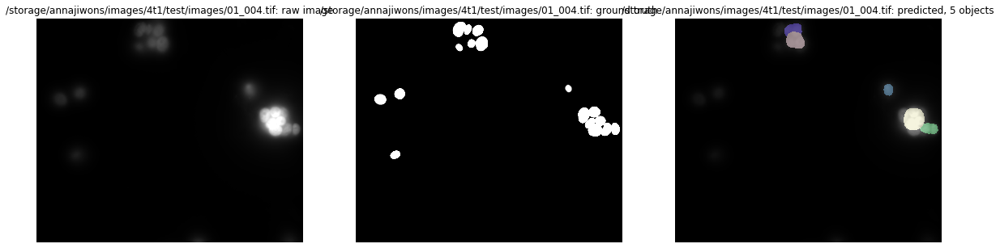

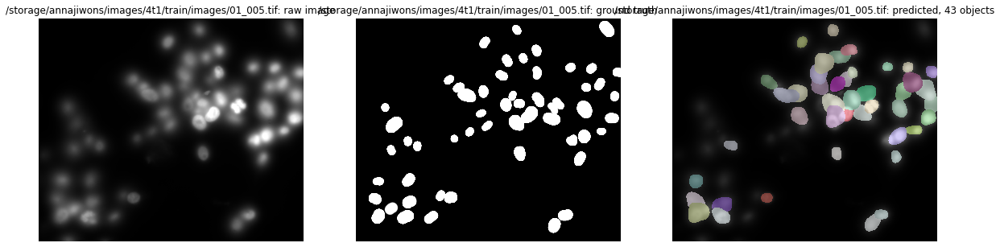

...

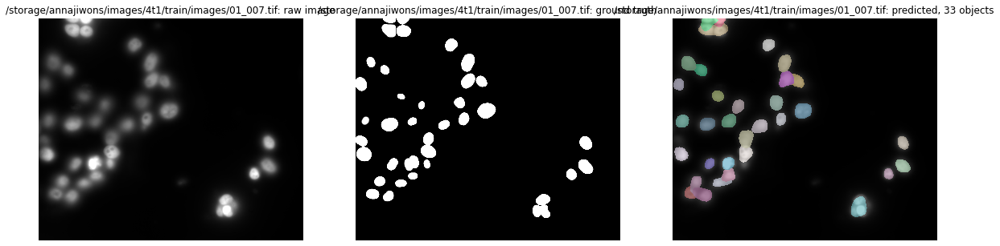

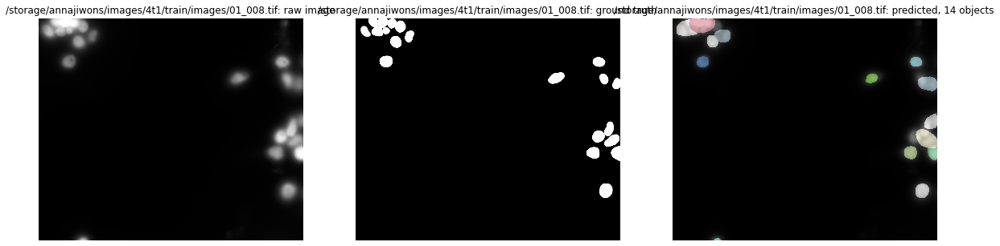

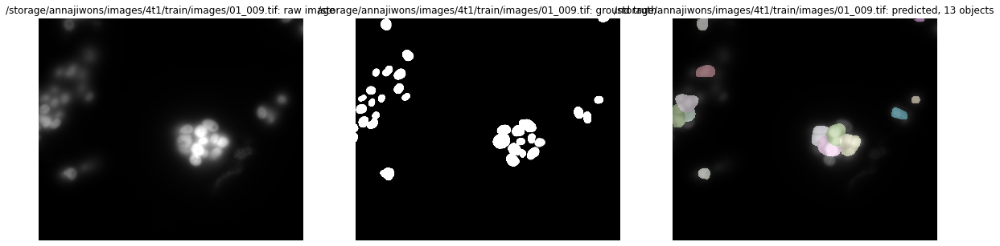

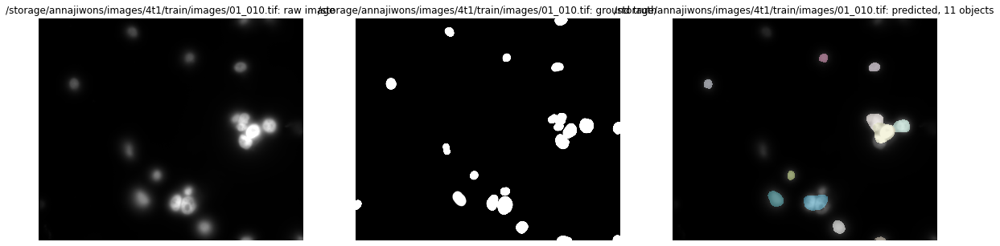

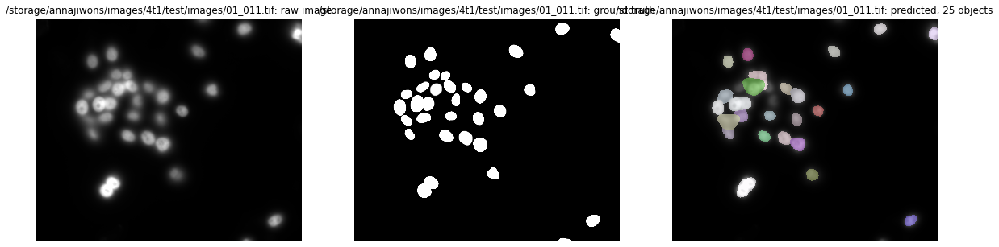

In [26]:
# Load model
stardist_10_model = StarDist2D(None, 
                                 name='2D_versatile_fluo_10', 
                                 basedir='../8_stardist_less_imgs/models')

# Predict
Y_pred = [stardist_10_model.predict_instances(x, n_tiles=stardist_10_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '4t1_model5')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# Save example image
cv.imwrite('4t1_model5.tif', Y_pred[10][0])

# StarDist model trained on U2OS nuclei images

  0%|          | 0/11 [00:00<?, ?it/s]

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 9/9 [00:45<00:00,  5.02s/it]


[DatasetMatching(criterion='iou', thresh=0.1, fp=12, tp=241, fn=118, precision=0.9525691699604744, recall=0.6713091922005571, accuracy=0.6495956873315364, f1=0.7875816993464052, n_true=359, n_pred=253, mean_true_score=0.336504295363346, mean_matched_score=0.5012657345868929, panoptic_quality=0.3947877190700693, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=33, tp=220, fn=139, precision=0.8695652173913043, recall=0.6128133704735376, accuracy=0.5612244897959183, f1=0.7189542483660131, n_true=359, n_pred=253, mean_true_score=0.3267879074741904, mean_matched_score=0.5332584490147017, panoptic_quality=0.38338842739619067, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=67, tp=186, fn=173, precision=0.7351778656126482, recall=0.5181058495821727, accuracy=0.43661971830985913, f1=0.6078431372549019, n_true=359, n_pred=253, mean_true_score=0.30277297608756193, mean_matched_score=0.5843844000829824, panoptic_quality=0.3552140471092638, by_image=False), Dataset

True

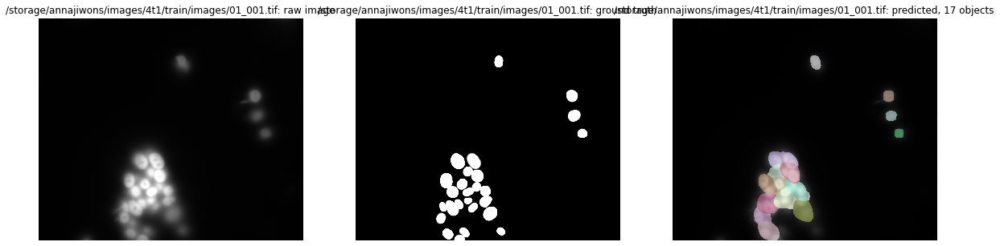

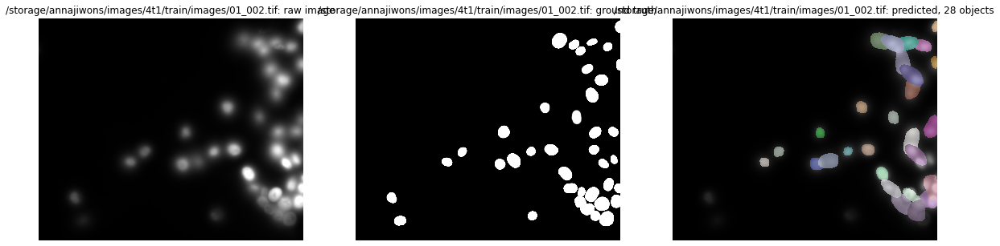

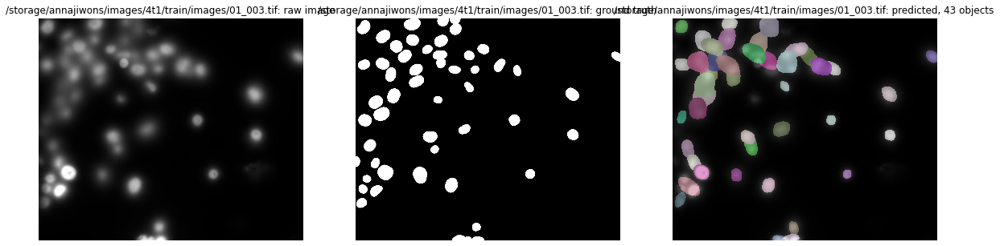

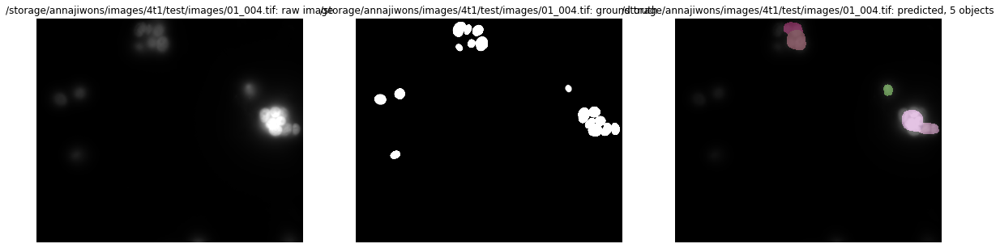

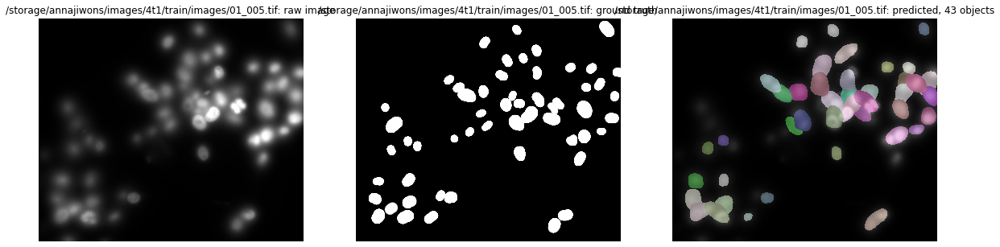

...

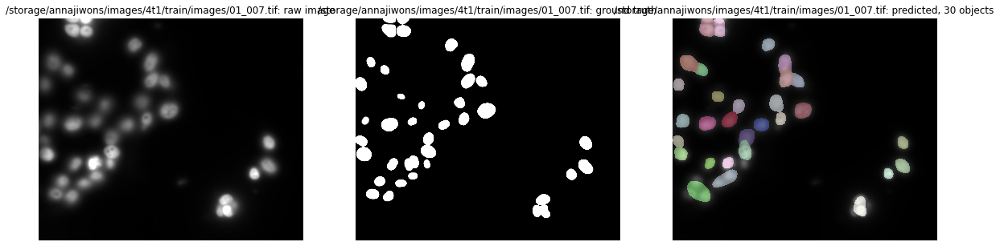

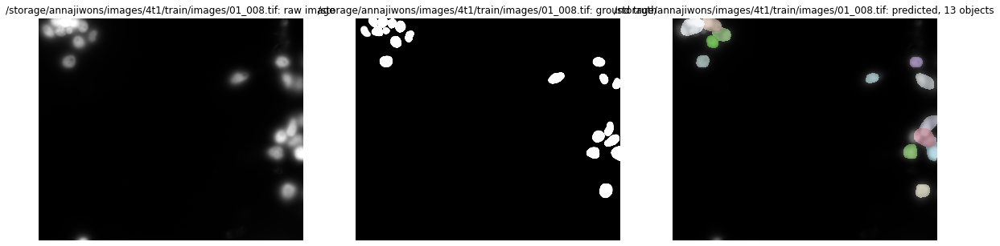

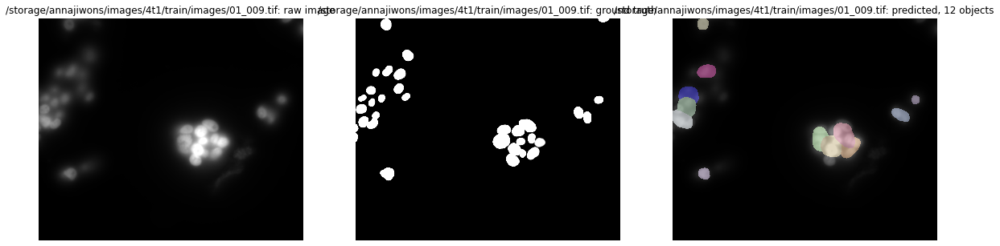

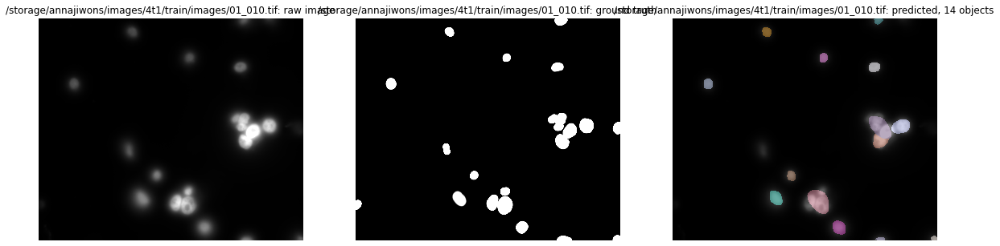

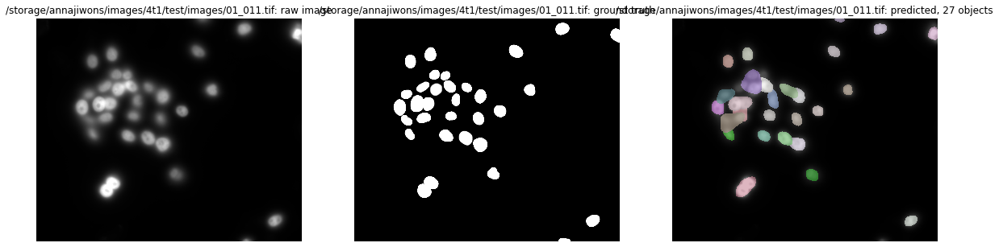

In [27]:
# Load model
u2os_stardist_model = StarDist2D(None, 
                                 name='manual_mask_merfish_model', 
                                 basedir='../3_stardist_merfish_manual_seg/models') 
                                 
# Predict
Y_pred = [u2os_stardist_model.predict_instances(x, 
                                                n_tiles=u2os_stardist_model._guess_n_tiles(x),                                                           show_tile_progress=False)
          for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_u2os_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# Save example image
cv.imwrite('4t1_model6.tif', Y_pred[10][0])

# SplineDist model trained in U2OS nuclei images

  0%|          | 0/11 [00:00<?, ?it/s]

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 9/9 [00:49<00:00,  5.45s/it]


[DatasetMatching(criterion='iou', thresh=0.1, fp=21, tp=242, fn=117, precision=0.9201520912547528, recall=0.6740947075208914, accuracy=0.6368421052631579, f1=0.7781350482315113, n_true=359, n_pred=263, mean_true_score=0.33150814220889296, mean_matched_score=0.49178273988839905, panoptic_quality=0.38267338602248413, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=36, tp=227, fn=132, precision=0.8631178707224335, recall=0.6323119777158774, accuracy=0.5746835443037974, f1=0.729903536977492, n_true=359, n_pred=263, mean_true_score=0.3250609112354671, mean_matched_score=0.5140831151256947, panoptic_quality=0.37523108403065175, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=83, tp=180, fn=179, precision=0.6844106463878327, recall=0.5013927576601671, accuracy=0.4072398190045249, f1=0.5787781350482315, n_true=359, n_pred=263, mean_true_score=0.29043008275028276, mean_matched_score=0.5792466650408418, panoptic_quality=0.33525530452524605, by_image=False), Data

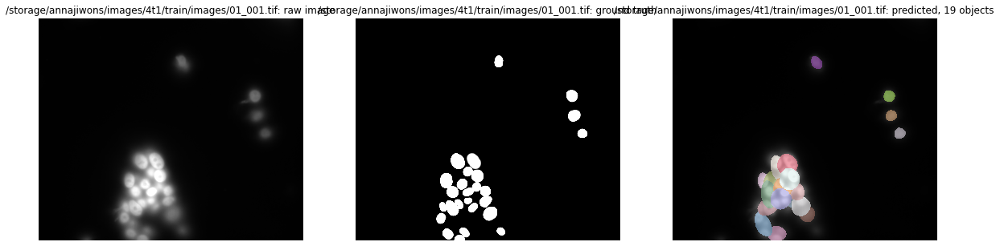

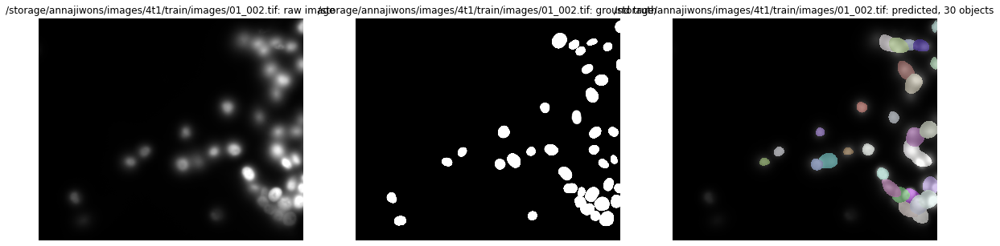

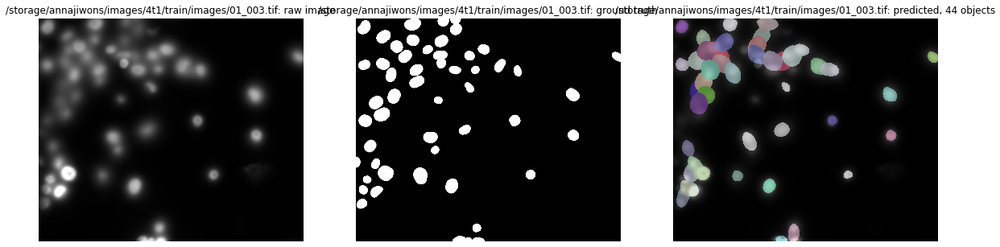

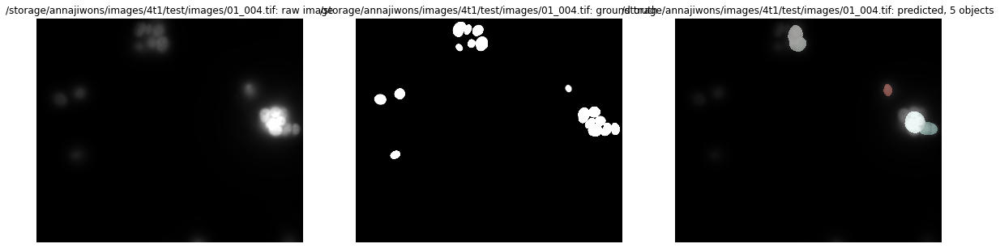

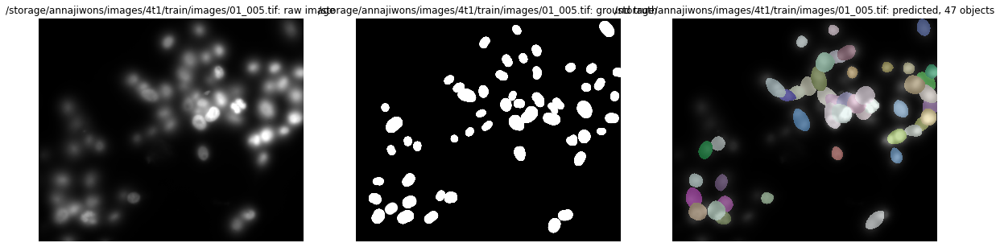

...

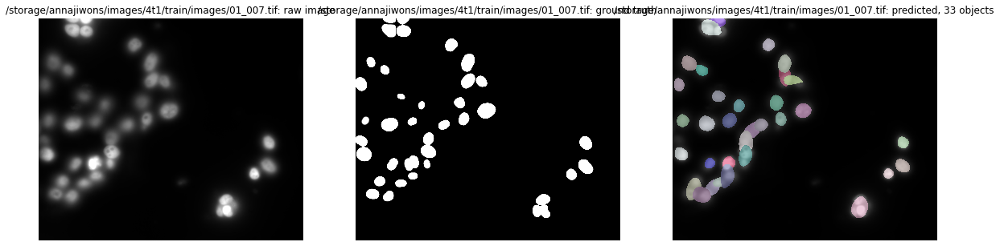

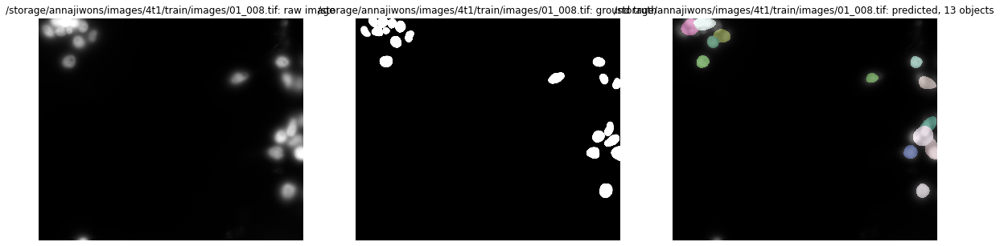

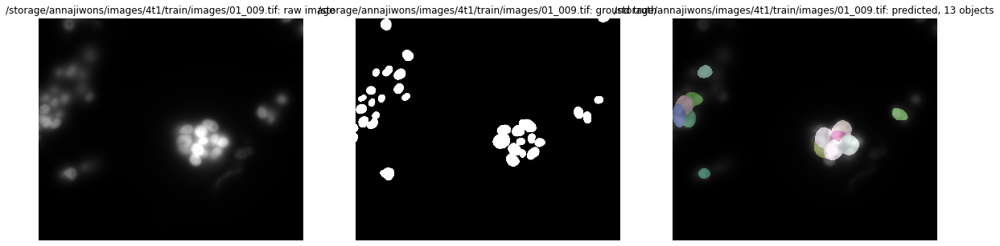

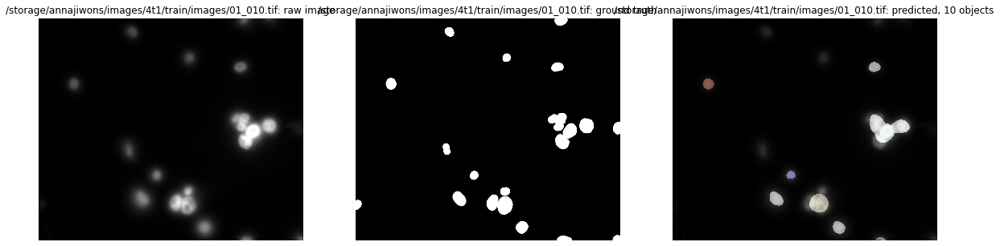

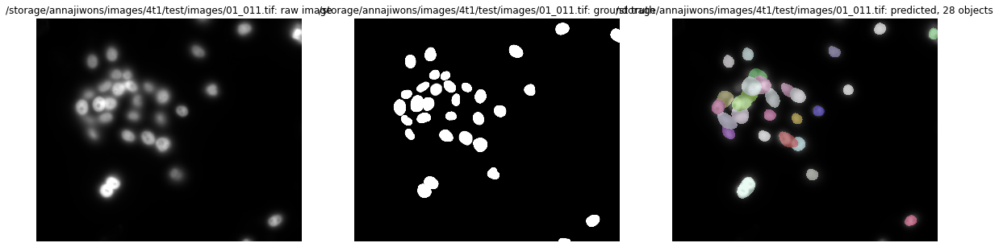

In [8]:
# Load model
u2os_splinedist_model = SplineDist2D(None, 
                                 name='splinedist_merfish', 
                                 basedir='../3_splinedist_merfish_manual_seg/models') 
# Predict
Y_pred = [u2os_splinedist_model.predict_instances(x, 
                                                  n_tiles=u2os_splinedist_model._guess_n_tiles(x),                                                         show_tile_progress=False)
          for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_u2os_splinedist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

In [9]:
cv.imwrite('4t1_model13.tif', Y_pred[10][0])

True

# Stardist model trained on U2OS nuclei images + Augmentation

## Flip/Rotation Augmenter

  0%|          | 0/11 [00:00<?, ?it/s]

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 9/9 [01:04<00:00,  7.19s/it]


[DatasetMatching(criterion='iou', thresh=0.1, fp=8, tp=204, fn=155, precision=0.9622641509433962, recall=0.5682451253481894, accuracy=0.555858310626703, f1=0.7145359019264448, n_true=359, n_pred=212, mean_true_score=0.29188321785841564, mean_matched_score=0.5136572314273099, panoptic_quality=0.36702653313895345, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=17, tp=195, fn=164, precision=0.9198113207547169, recall=0.5431754874651811, accuracy=0.5186170212765957, f1=0.6830122591943958, n_true=359, n_pred=212, mean_true_score=0.2876901222487065, mean_matched_score=0.5296448917296699, panoptic_quality=0.361753954071053, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=51, tp=161, fn=198, precision=0.7594339622641509, recall=0.44846796657381616, accuracy=0.3926829268292683, f1=0.563922942206655, n_true=359, n_pred=212, mean_true_score=0.2638542582093924, mean_matched_score=0.5883458304172167, panoptic_quality=0.3317817117238945, by_image=False), DatasetMat

True

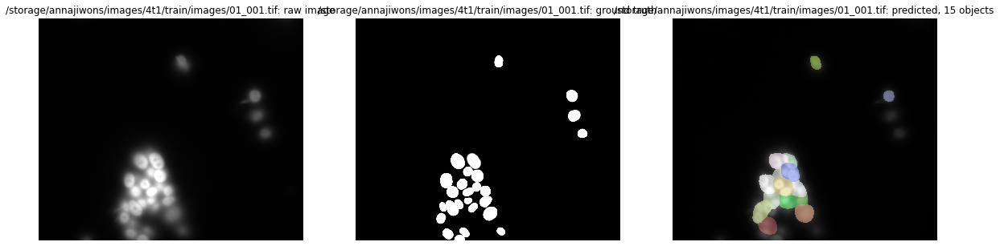

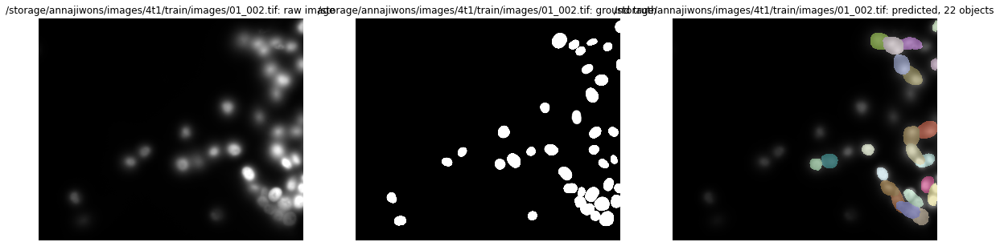

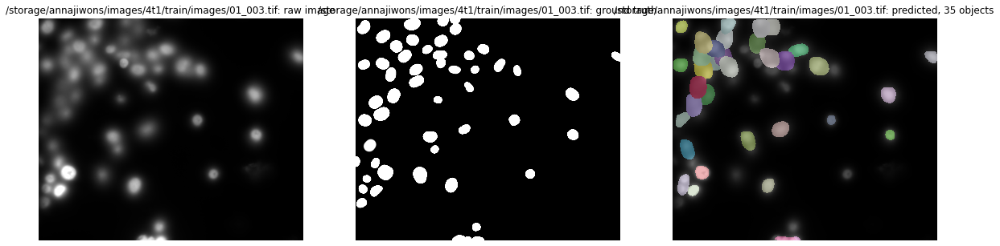

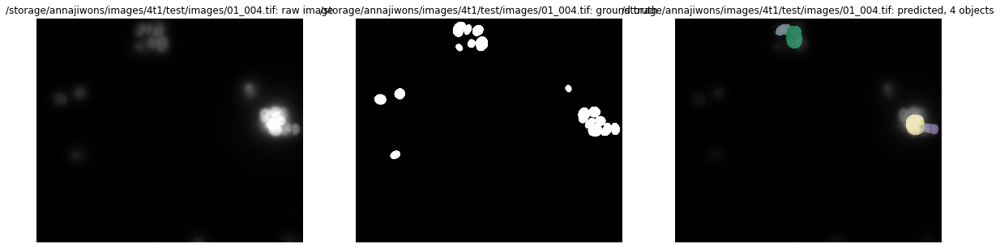

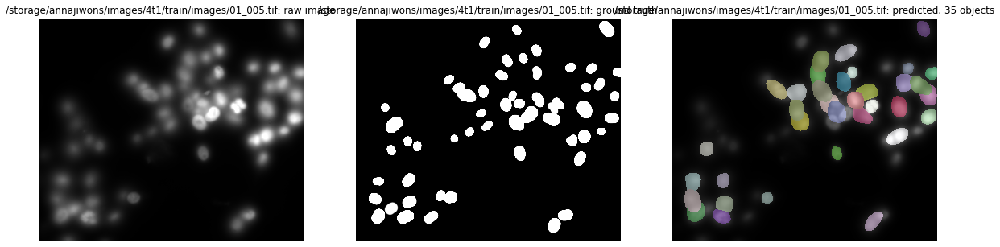

...

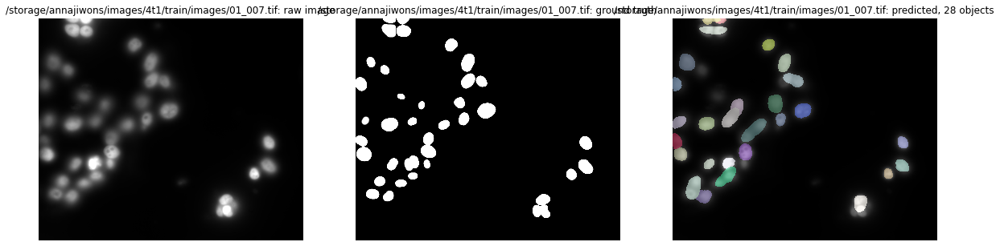

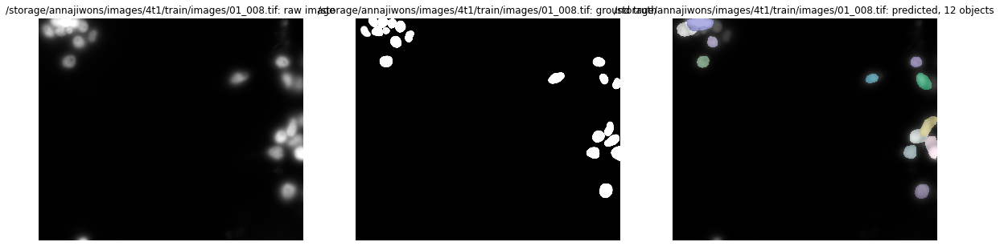

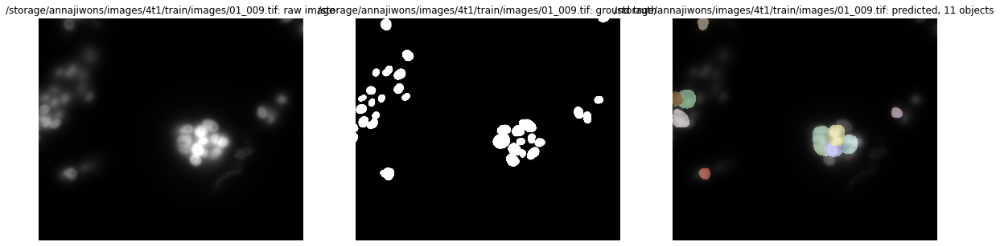

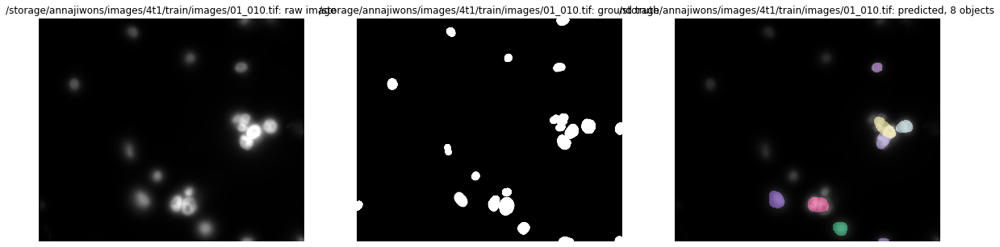

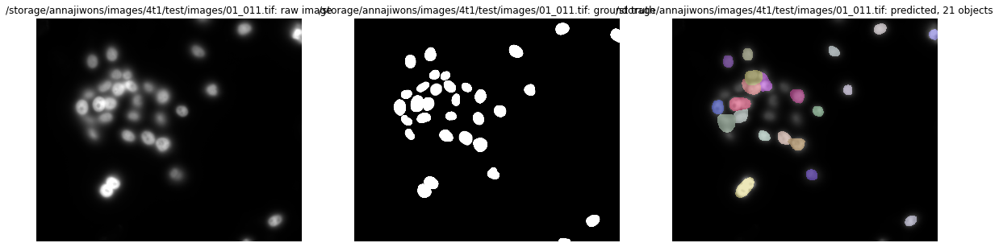

In [28]:
# Load model
fliprot_stardist_model = StarDist2D(None, 
                                    name='fliprot_aug_merfish_model', 
                                    basedir='../5_stardist_merfish_augmented/models') 
# Predict
Y_pred = [fliprot_stardist_model.predict_instances(x, 
                                                   n_tiles=fliprot_stardist_model._guess_n_tiles(x),                                                        show_tile_progress=False)
          for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_fliprot_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# Save example image
cv.imwrite('4t1_model7.tif', Y_pred[10][0])

## Intensity Augmenter

  0%|          | 0/11 [00:00<?, ?it/s]

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 9/9 [00:48<00:00,  5.38s/it]


[DatasetMatching(criterion='iou', thresh=0.1, fp=3, tp=273, fn=86, precision=0.9891304347826086, recall=0.7604456824512534, accuracy=0.7541436464088398, f1=0.8598425196850393, n_true=359, n_pred=276, mean_true_score=0.4786502481956121, mean_matched_score=0.6294338428652921, panoptic_quality=0.5412139814243299, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=5, tp=271, fn=88, precision=0.9818840579710145, recall=0.754874651810585, accuracy=0.7445054945054945, f1=0.8535433070866142, n_true=359, n_pred=276, mean_true_score=0.4776551180876449, mean_matched_score=0.6327608390902749, panoptic_quality=0.5400887791920143, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=10, tp=266, fn=93, precision=0.9637681159420289, recall=0.7409470752089137, accuracy=0.7208672086720868, f1=0.8377952755905512, n_true=359, n_pred=276, mean_true_score=0.4740441790015057, mean_matched_score=0.6397814295546638, panoptic_quality=0.5360058590914663, by_image=False), DatasetMatching

True

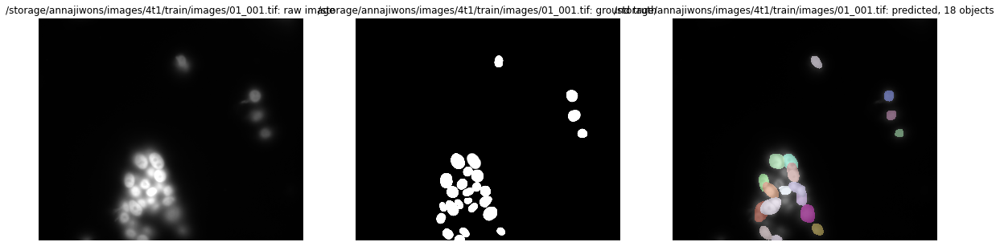

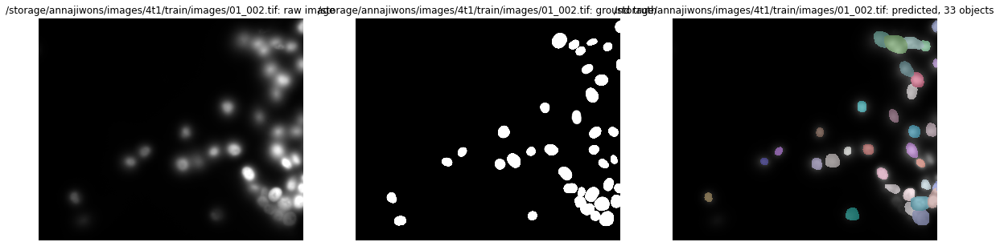

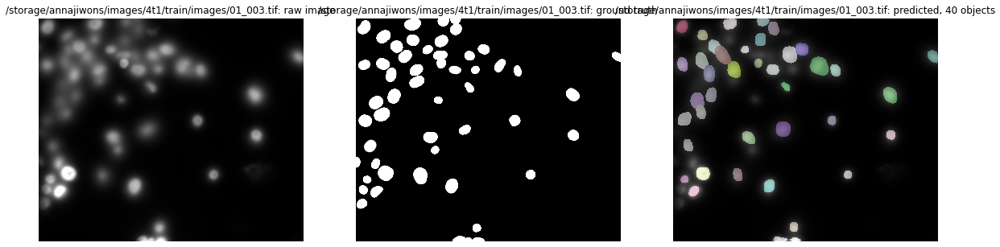

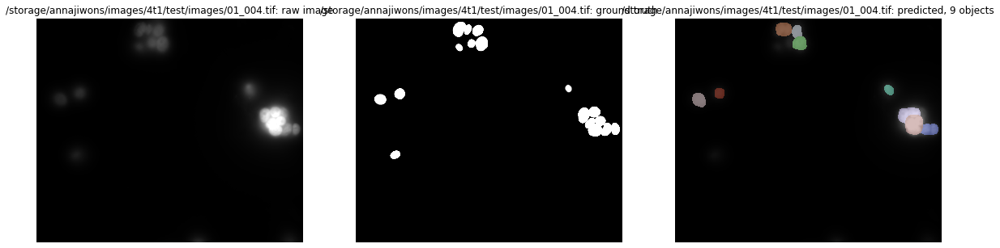

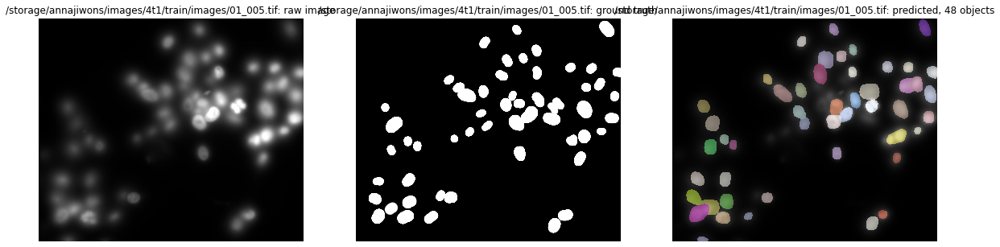

...

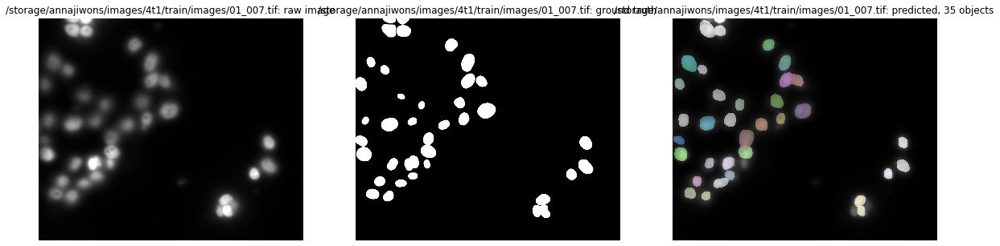

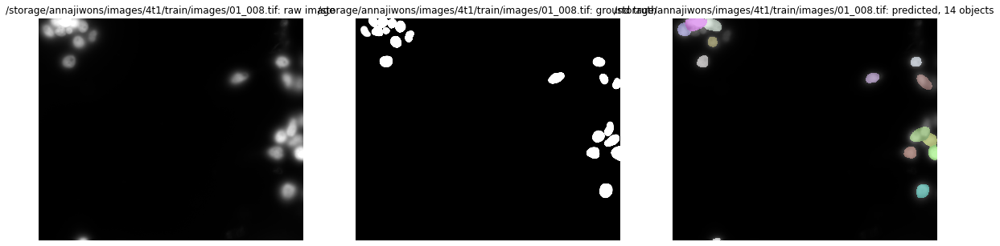

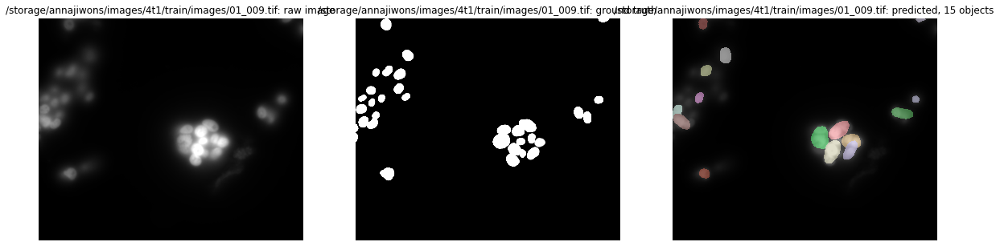

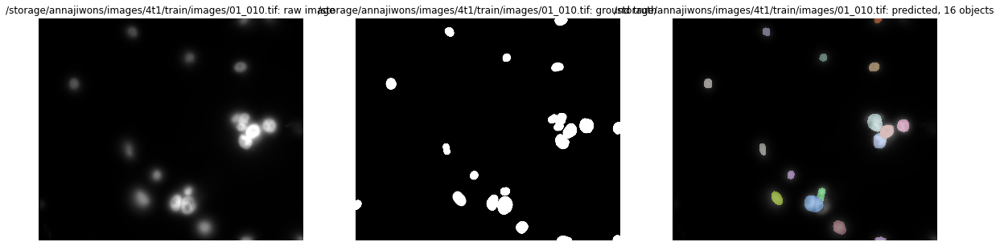

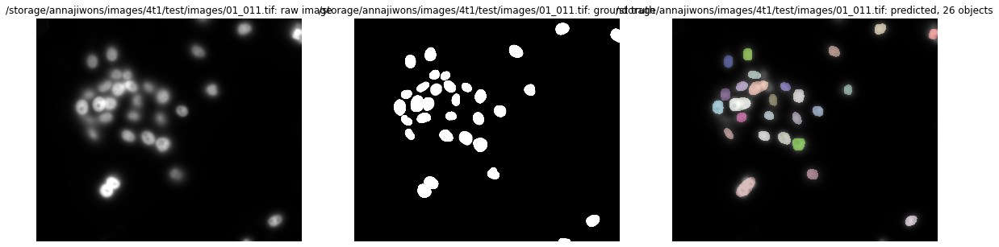

In [29]:
# Load model
intensity_stardist_model = StarDist2D(None, 
                                    name='intensity_aug_merfish_model', 
                                    basedir='../5_stardist_merfish_augmented/models') 
# Predict
Y_pred = [intensity_stardist_model.predict_instances(x, 
                                                   n_tiles=intensity_stardist_model._guess_n_tiles(x),                                                        show_tile_progress=False)
          for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_intensity_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# Save example image
cv.imwrite('4t1_model8.tif', Y_pred[10][0])

## Noise Augmenter

  0%|          | 0/11 [00:00<?, ?it/s]

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 9/9 [00:43<00:00,  4.83s/it]


[DatasetMatching(criterion='iou', thresh=0.1, fp=6, tp=243, fn=116, precision=0.9759036144578314, recall=0.6768802228412256, accuracy=0.6657534246575343, f1=0.7993421052631579, n_true=359, n_pred=249, mean_true_score=0.34899783838961534, mean_matched_score=0.5155976295550284, panoptic_quality=0.4121388946772102, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=20, tp=229, fn=130, precision=0.9196787148594378, recall=0.637883008356546, accuracy=0.604221635883905, f1=0.7532894736842105, n_true=359, n_pred=249, mean_true_score=0.3426438640636431, mean_matched_score=0.5371578480299034, panoptic_quality=0.40463535262778905, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=57, tp=192, fn=167, precision=0.7710843373493976, recall=0.5348189415041783, accuracy=0.46153846153846156, f1=0.631578947368421, n_true=359, n_pred=249, mean_true_score=0.31574963998010835, mean_matched_score=0.5903860455878068, panoptic_quality=0.37287539721335167, by_image=False), DatasetM

True

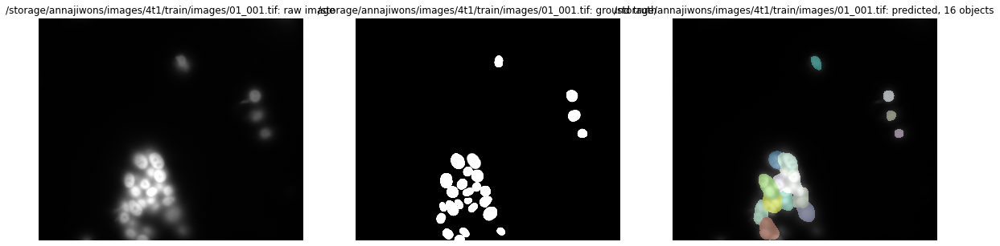

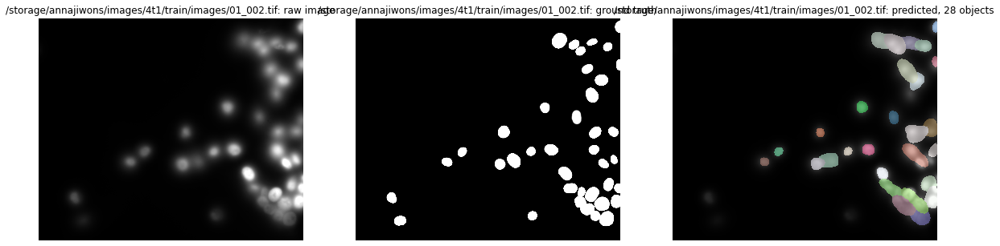

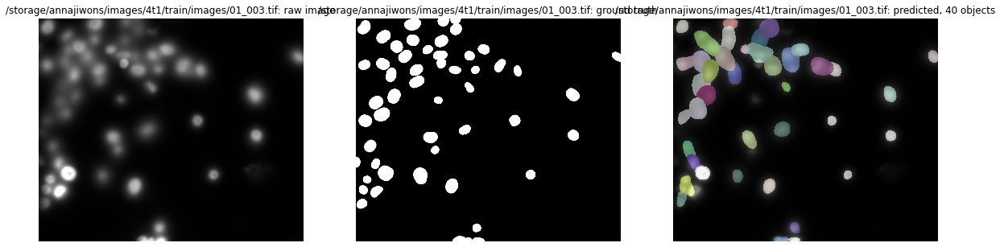

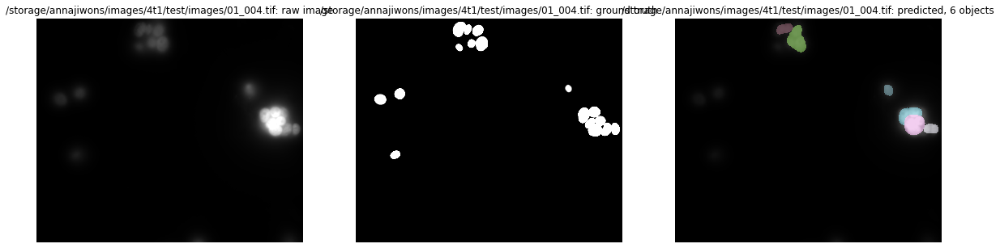

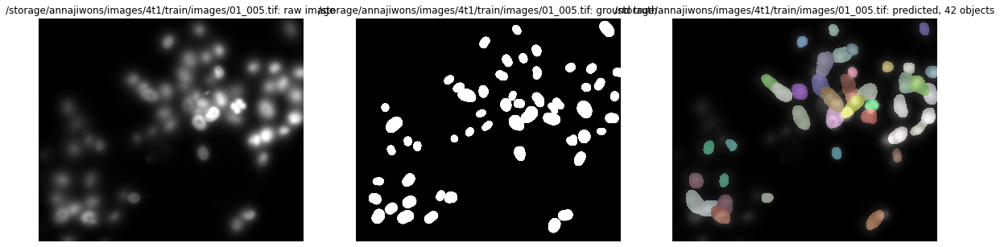

...

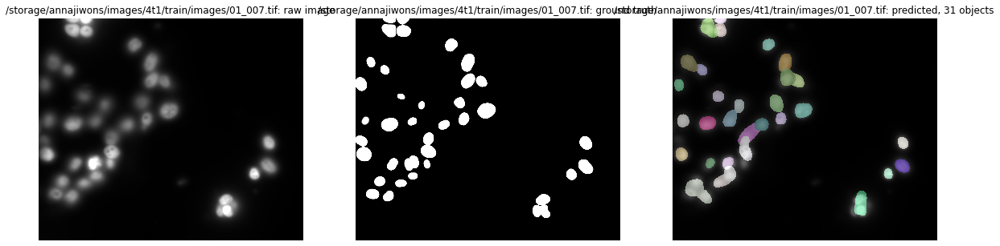

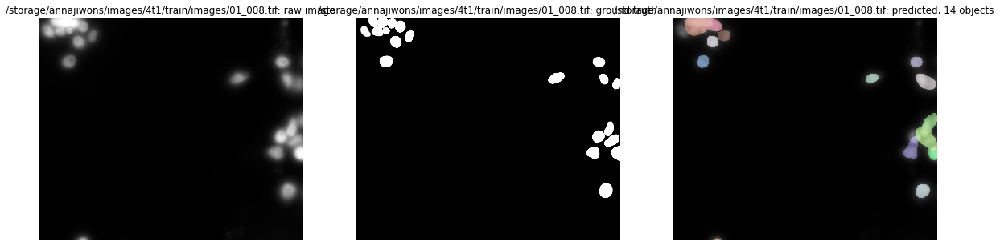

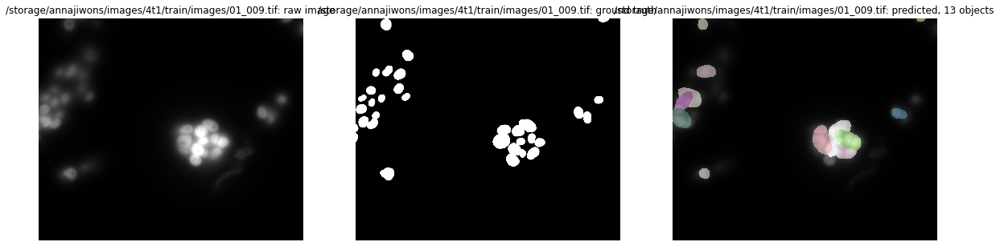

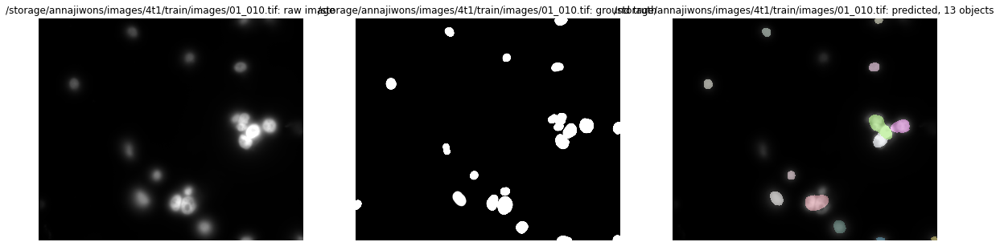

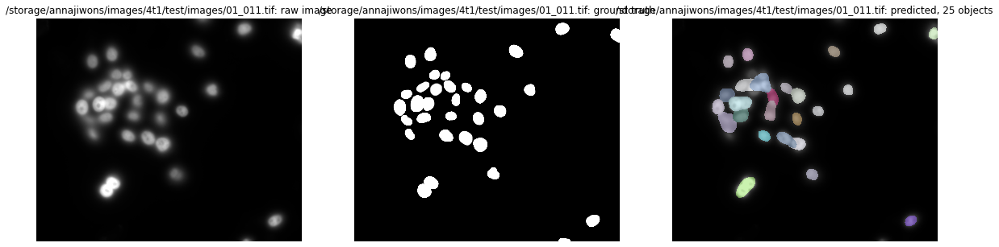

In [30]:
# Load model
noise_stardist_model = StarDist2D(None, 
                                    name='noise_aug_merfish_model', 
                                    basedir='../5_stardist_merfish_augmented/models') 
# Predict
Y_pred = [noise_stardist_model.predict_instances(x, 
                                                   n_tiles=noise_stardist_model._guess_n_tiles(x),                                                        show_tile_progress=False)
          for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_noise_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# Save example image
cv.imwrite('4t1_model9.tif', Y_pred[10][0])

# StarDist model trained on smFISH Images

In [8]:
# Load all smfish images
smfish_X_test_names = glob(f'{smfish_4t1_dir}/images/*.tif')
smfish_X_test_names.sort(key=lambda name: name[-6:])
smfish_X_test = [normalize(img, 1, 99.8, axis=(0, 1)) for img in list(map(io.imread, smfish_X_test_names))]

  0%|          | 0/11 [00:00<?, ?it/s]Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.780102, nms_thresh=0.3.
100%|██████████| 9/9 [00:20<00:00,  2.31s/it]
[DatasetMatching(criterion='iou', thresh=0.1, fp=74, tp=187, fn=172, precision=0.7164750957854407, recall=0.520891364902507, accuracy=0.43187066974595845, f1=0.603225806451613, n_true=359, n_pred=261, mean_true_score=0.1521490157406761, mean_matched_score=0.2920935649780894, panoptic_quality=0.1761983762932346, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=122, tp=139, fn=220, precision=0.5325670498084292, recall=0.3871866295264624, accuracy=0.288981288981289, f1=0.4483870967741935, n_true=359, n_pred=261, mean_true_score=0.1315151948578307, mean_matched_score=0.33966874067598, panoptic_quality=0.1523030804966491, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=182, tp=79, fn=280, precision=0.30268199233716475, recall=0

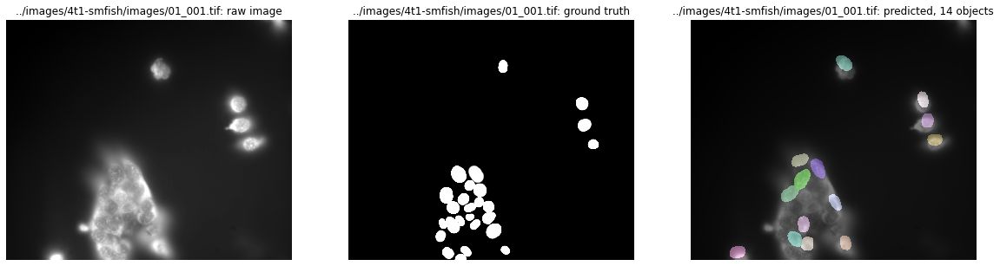

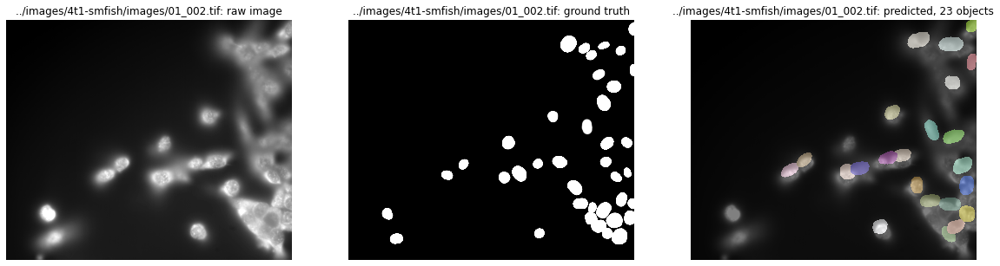

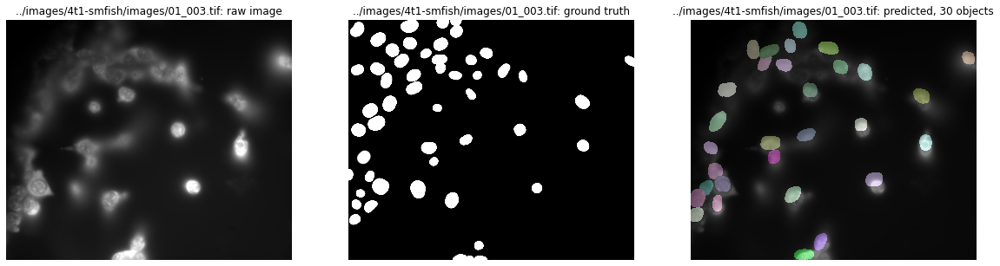

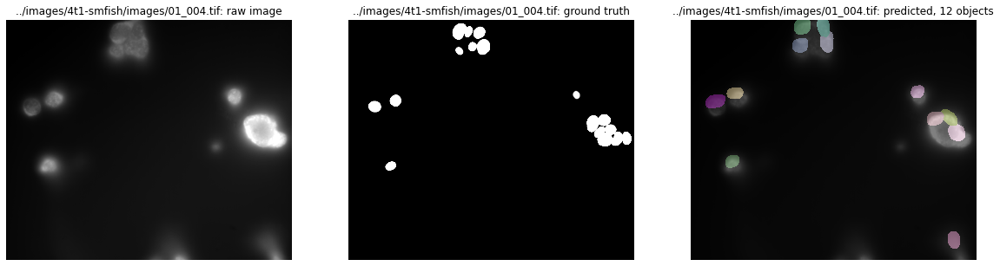

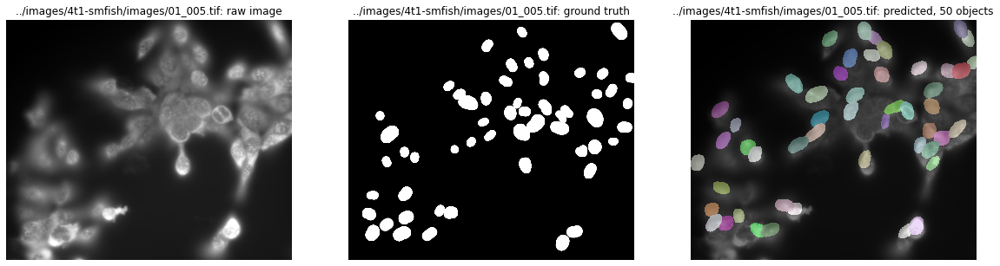

...

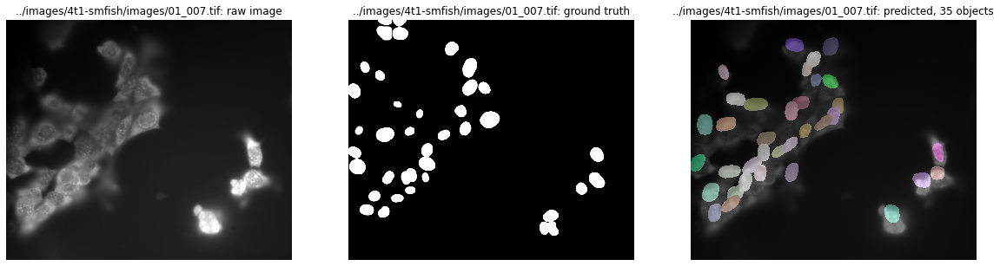

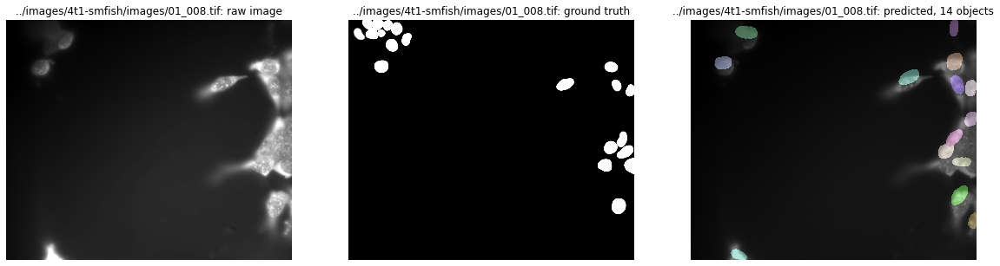

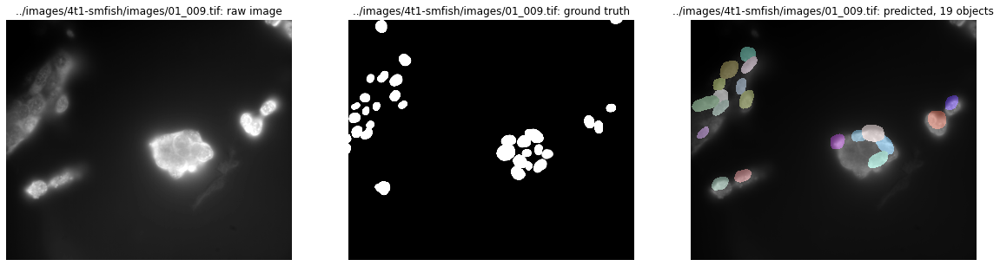

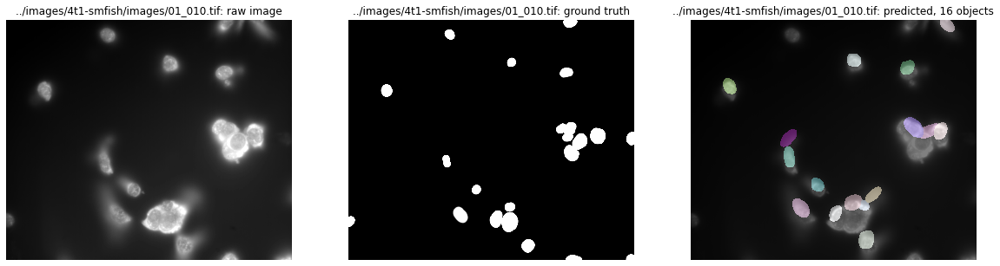

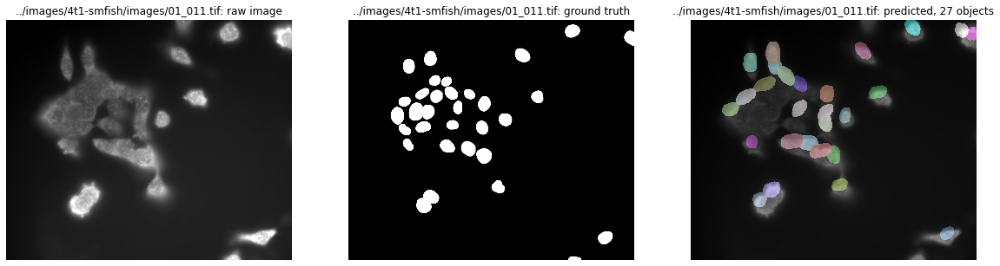

In [10]:
# Load model
smfish_stardist_model = StarDist2D(None, 
                                    name='smfish_nuclei_model', 
                                    basedir='../6_smfish_nuclei/models') 
# Predict
Y_pred = [smfish_stardist_model.predict_instances(x, 
                                                   n_tiles=smfish_stardist_model._guess_n_tiles(x),                                                        show_tile_progress=False)
          for x in tqdm(smfish_X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_smfish_stardist')

# Show images
show_test_images(smfish_X_test, Y_test, Y_pred, smfish_X_test_names)

# Watershed

In [6]:
X_test_no_normalize = list(map(cv.imread, X_test_names))

In [6]:
# Using best parameters for U2OS cells
tp_total, fp_total, fn_total = evaluate_all(X_test_no_normalize, Y_test, {'alpha': 0.5,
                                                    'beta': 15,
                                                    'blur_ksize': 3,
                                                    'dilate_itr': 4,
                                                    'foreground_thresh_ratio': 0.5,
                                                    'morph_kernel': np.array([[1, 1, 1, 1, 1],
                                                                              [1, 1, 1, 1, 1],
                                                                              [1, 1, 1, 1, 1],
                                                                              [1, 1, 1, 1, 1],
                                                                              [1, 1, 1, 1, 1]],                                                                                               dtype=np.uint8),
                                                    'opening_itr': 3,
                                                    'thresh_method': 8,
                                                    'upper_limit': 236})

In [7]:
df = pd.DataFrame(columns = ['Threshold', 'FP', 'TP', 'FN','Accuracy', 'F1'])

taus = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

for tau in taus:
    tp = tp_total[tau]
    fp = fp_total[tau]
    fn = fn_total[tau]

    f1_score = (2 * tp) / (2 * tp + fp + fn) if tp > 0 else 0
    print(f'f1 score for tau = {tau}: {f1_score}')

    avg_precision = tp / (tp + fn + fp) if tp > 0 else 0
    print(f'average precision for tau = {tau}: {avg_precision}')
    df = df.append({'Threshold': tau, 'FP': fp, 'TP': tp, 'FN': fn, 
               'Accuracy': avg_precision, 'F1': f1_score}, ignore_index = True)

f1 score for tau = 0.1: 0.1971153846153846
average precision for tau = 0.1: 0.10933333333333334
f1 score for tau = 0.2: 0.15865384615384615
average precision for tau = 0.2: 0.08616187989556136
f1 score for tau = 0.3: 0.1201923076923077
average precision for tau = 0.3: 0.0639386189258312
f1 score for tau = 0.4: 0.09615384615384616
average precision for tau = 0.4: 0.050505050505050504
f1 score for tau = 0.5: 0.07211538461538461
average precision for tau = 0.5: 0.03740648379052369
f1 score for tau = 0.6: 0.052884615384615384
average precision for tau = 0.6: 0.027160493827160494
f1 score for tau = 0.7: 0.03365384615384615
average precision for tau = 0.7: 0.017114914425427872
f1 score for tau = 0.8: 0.03365384615384615
average precision for tau = 0.8: 0.017114914425427872
f1 score for tau = 0.9: 0.009615384615384616
average precision for tau = 0.9: 0.004830917874396135


In [8]:
df

,Threshold,FP,TP,FN,Accuracy,F1
0,0.1,16.0,41.0,318.0,0.109333,0.197115
1,0.2,24.0,33.0,326.0,0.086162,0.158654
2,0.3,32.0,25.0,334.0,0.063939,0.120192
3,0.4,37.0,20.0,339.0,0.050505,0.096154
4,0.5,42.0,15.0,344.0,0.037406,0.072115
5,0.6,46.0,11.0,348.0,0.027160,0.052885
6,0.7,50.0,7.0,352.0,0.017115,0.033654
7,0.8,50.0,7.0,352.0,0.017115,0.033654
8,0.9,55.0,2.0,357.0,0.004831,0.009615


In [9]:
df.to_csv('4t1_watershed.csv', index = False)

In [16]:
# Get best parameters
get_best_params(X_test_no_normalize, Y_test, param_tries = 500)

100%|██████████| 500/500 [55:32<00:00,  6.67s/it]


({'alpha': 0.5,
  'beta': 15,
  'blur_ksize': 3,
  'dilate_itr': 3,
  'foreground_thresh_ratio': 0.3,
  'morph_kernel': array([[1, 1],
         [1, 1]], dtype=uint8),
  'opening_itr': 3,
  'thresh_method': 16,
  'upper_limit': 250},
 {0.6: 40, 0.7: 34, 0.8: 28, 0.9: 8},
 {0.6: 65, 0.7: 71, 0.8: 77, 0.9: 97},
 {0.6: 319, 0.7: 325, 0.8: 331, 0.9: 351})

In [13]:
tp_total, fp_total, fn_total = evaluate_all(X_test_no_normalize, Y_test, 
                                           {'alpha': 0.5,
                                            'beta': 15,
                                            'blur_ksize': 3,
                                            'dilate_itr': 3,
                                            'foreground_thresh_ratio': 0.3,
                                            'morph_kernel': np.array([[1, 1],
                                                    [1, 1]], dtype=np.uint8),
                                            'opening_itr': 3,
                                            'thresh_method': 16,
                                            'upper_limit': 250})

In [14]:
df = pd.DataFrame(columns = ['Threshold', 'FP', 'TP', 'FN','Accuracy', 'F1'])

taus = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

for tau in taus:
    tp = tp_total[tau]
    fp = fp_total[tau]
    fn = fn_total[tau]

    f1_score = (2 * tp) / (2 * tp + fp + fn) if tp > 0 else 0
    print(f'f1 score for tau = {tau}: {f1_score}')

    avg_precision = tp / (tp + fn + fp) if tp > 0 else 0
    print(f'average precision for tau = {tau}: {avg_precision}')
    df = df.append({'Threshold': tau, 'FP': fp, 'TP': tp, 'FN': fn, 
               'Accuracy': avg_precision, 'F1': f1_score}, ignore_index = True)

f1 score for tau = 0.1: 0.35344827586206895
average precision for tau = 0.1: 0.21465968586387435
f1 score for tau = 0.2: 0.31896551724137934
average precision for tau = 0.2: 0.18974358974358974
f1 score for tau = 0.3: 0.27586206896551724
average precision for tau = 0.3: 0.16
f1 score for tau = 0.4: 0.24568965517241378
average precision for tau = 0.4: 0.14004914004914004
f1 score for tau = 0.5: 0.21120689655172414
average precision for tau = 0.5: 0.1180722891566265
f1 score for tau = 0.6: 0.1724137931034483
average precision for tau = 0.6: 0.09433962264150944
f1 score for tau = 0.7: 0.14655172413793102
average precision for tau = 0.7: 0.07906976744186046
f1 score for tau = 0.8: 0.1206896551724138
average precision for tau = 0.8: 0.06422018348623854
f1 score for tau = 0.9: 0.034482758620689655
average precision for tau = 0.9: 0.017543859649122806


In [15]:
df.to_csv('4t1_watershed_opt.csv', index = False)

In [18]:
res1 = watershed_seg(X_test_no_normalize[10], upper_limit = 241, alpha = 0.5, beta = 5, blur_ksize = 7, 
                            thresh_method = 16, morph_kernel = np.array([[1, 1, 1, 1, 1, 1],
                                                     [1, 1, 1, 1, 1, 1],
                                                     [1, 1, 1, 1, 1, 1],
                                                     [1, 1, 1, 1, 1, 1],
                                                     [1, 1, 1, 1, 1, 1],
                                                     [1, 1, 1, 1, 1, 1]]), opening_itr = 1, 
                            dilate_itr = 3, foreground_thresh_ratio = 0.5, zero_boundaries = True)

res2 = watershed_seg(X_test_no_normalize[10], upper_limit = 250, alpha = 0.5, beta = 15, blur_ksize = 3, 
                            thresh_method = 16, morph_kernel = np.array([[1, 1],
                                                                         [1, 1]], dtype=np.uint8), opening_itr = 3, 
                            dilate_itr = 3, foreground_thresh_ratio = 0.3, zero_boundaries = True)

(-0.5, 2559.5, 2159.5, -0.5)

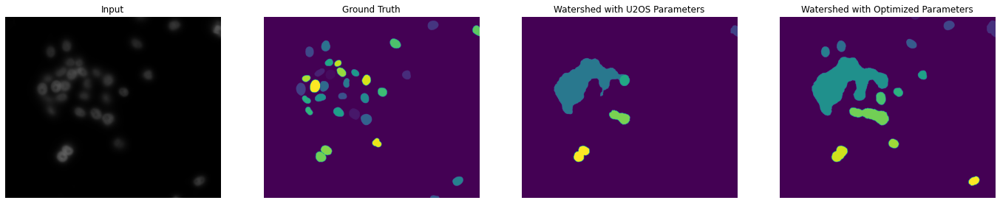

In [19]:
figure, figure_axes = plt.subplots(1, 4, figsize=(24, 6))
figure_axes[0].imshow(X_test_no_normalize[10])
figure_axes[0].set_title('Input')
figure_axes[0].axis('off')

figure_axes[1].imshow(Y_test[10])
figure_axes[1].set_title('Ground Truth')
figure_axes[1].axis('off')

figure_axes[2].imshow(res1)
figure_axes[2].set_title('Watershed with U2OS Parameters')
figure_axes[2].axis('off')

figure_axes[3].imshow(res2)
figure_axes[3].set_title('Watershed with Optimized Parameters')
figure_axes[3].axis('off')

In [7]:
results = []
for img in X_test_no_normalize:
    res = watershed_seg(img, upper_limit = 250, alpha = 0.5, beta = 15, blur_ksize = 3, 
                            thresh_method = 16, morph_kernel = np.array([[1, 1],
                                                                         [1, 1]], dtype=np.uint8), opening_itr = 3, 
                            dilate_itr = 3, foreground_thresh_ratio = 0.3, zero_boundaries = True)
    results.append(res)

(-0.5, 2559.5, 2159.5, -0.5)

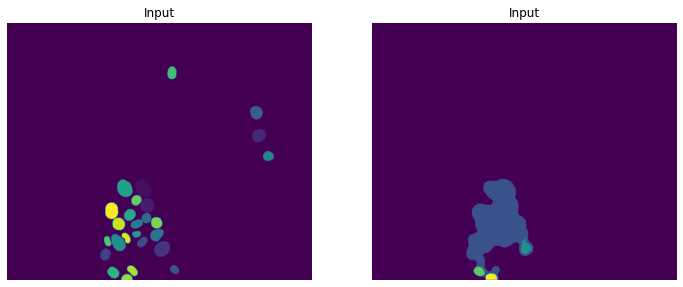

In [20]:
figure, figure_axes = plt.subplots(1, 2,figsize=(12, 6))
figure_axes[0].imshow(Y_test[0])
figure_axes[0].set_title('Input')
figure_axes[0].axis('off')

figure_axes[1].imshow(results[0])
figure_axes[1].set_title('Input')
figure_axes[1].axis('off')

# Pretrained StarDist model + 10 Additional U2OS images + Additional 4t1 Images

In [31]:
# Load images in test dirs
X_test_small_names = glob(f'{nuclei_4t1_dir}/test/images/*.tif')
X_test_small_names.sort(key=lambda name: name[-6:])
X_test_small = [normalize(img, 1, 99.8, axis=(0, 1)) for img in list(map(io.imread, X_test_small_names))]

# Load masks in test dirs
Y_test_small_names = glob(f'{nuclei_4t1_dir}/test/masks/*.tif')
Y_test_small_names.sort(key=lambda name: name[-6:])
Y_test_small = list(map(io.imread, Y_test_small_names))

  0%|          | 0/2 [00:00<?, ?it/s]

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 9/9 [00:08<00:00,  1.11it/s]


[DatasetMatching(criterion='iou', thresh=0.1, fp=1, tp=46, fn=3, precision=0.9787234042553191, recall=0.9387755102040817, accuracy=0.92, f1=0.9583333333333334, n_true=49, n_pred=47, mean_true_score=0.7406516764707015, mean_matched_score=0.7889550466753125, panoptic_quality=0.7560819197305078, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=1, tp=46, fn=3, precision=0.9787234042553191, recall=0.9387755102040817, accuracy=0.92, f1=0.9583333333333334, n_true=49, n_pred=47, mean_true_score=0.7406516764707015, mean_matched_score=0.7889550466753125, panoptic_quality=0.7560819197305078, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=2, tp=45, fn=4, precision=0.9574468085106383, recall=0.9183673469387755, accuracy=0.8823529411764706, f1=0.9375, n_true=49, n_pred=47, mean_true_score=0.7358780757069253, mean_matched_score=0.8012894602142075, panoptic_quality=0.7512088689508195, by_image=False), DatasetMatching(criterion='iou', thresh=0.4, fp=2, tp=45, fn=4, pre

True

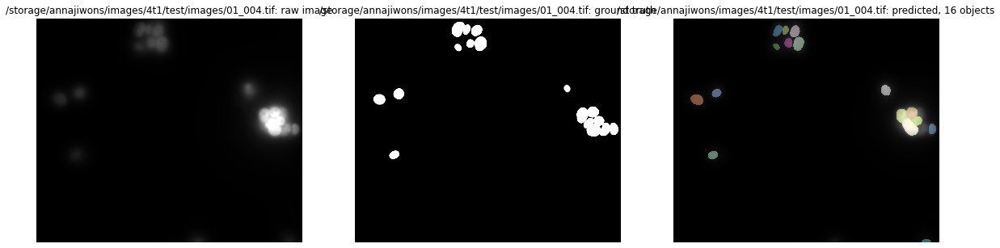

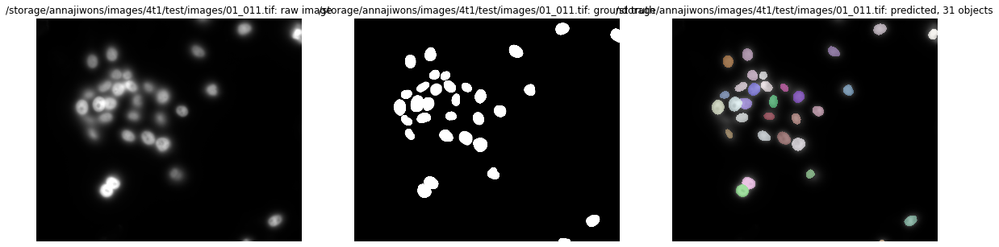

In [34]:
# Load model
pretrained_add10_add4t1_stardist_model = StarDist2D(None, 
                                    name='2D_versatile_fluo_10_u2os', 
                                    basedir='./models') 
# Predict
Y_pred = [pretrained_add10_add4t1_stardist_model.predict_instances(x, 
                                                   n_tiles=pretrained_add10_add4t1_stardist_model._guess_n_tiles(x),                                                        show_tile_progress=False)
          for x in tqdm(X_test_small)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test_small, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_add4t1_stardist')

# Show images
show_test_images(X_test_small, Y_test_small, Y_pred, X_test_small_names)

# Save example image
cv.imwrite('4t1_model12.tif', Y_pred[1][0])